# ALl the background functions

In [3]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
import numpy as np

import re

import re, json

def clean_json_string(json_str: str) -> str:
    json_str = re.sub(r'\n\s*"', r', "', json_str)            # join broken key-lines
    json_str = re.sub(r',\s*}', '}', json_str)               # drop trailing commas
    try:
        return json_str.encode('utf-8').decode('unicode_escape')
    except Exception:
        return json_str

def parse_parsed_chat_repr(s: str) -> dict:
    """
    Parse a printed ParsedChatCompletion-like string into a dict:
    keys: repr_type, id, model, object, created, contents (list), usage (dict)
    """
    out = {}
    m = re.match(r'^([\w\.]+\[[^\]]+\])', s)
    out['repr_type'] = m.group(1) if m else None
    for key in ('id', 'model', 'object'):
        m = re.search(rf"{key}=['\"]([^'\"]+)['\"]", s)
        out[key] = m.group(1) if m else None
    m = re.search(r"created=(\d+)", s)
    out['created'] = int(m.group(1)) if m else None

    # Extract usage if present (only top-level ints)
    m = re.search(r"usage=CompletionUsage\(([^)]+)\)", s)
    if m:
        usage_str = m.group(1)
        usage = {}
        # Only match key=value where value is an integer and not inside parentheses
        for k, v in re.findall(r"(\w+)=([0-9]+)", usage_str):
            usage[k] = int(v)
        out['usage'] = usage

    contents = []
    for m in re.finditer(r"content=(?:'|\")(\{.*?\})(?:'|\")", s, re.DOTALL):
        js = m.group(1)
        try:
            contents.append(json.loads(js))
        except json.JSONDecodeError:
            try:
                contents.append(json.loads(clean_json_string(js)))
            except Exception:
                contents.append({'__raw': js})
    out['contents'] = contents
    return out


def process_test_results(test_results, prompts_to_check=["prompts1"]):
    result_dict = {}
    for key in test_results.keys():
        print(f"Processing key: {key}")
        for run in test_results[key]:
            print(f" Processing run: {run}")
            parsed_outputs_per_run = {}
            for entry in prompts_to_check:
                #print(f"  Processing entry: {entry}")
                if entry not in parsed_outputs_per_run:
                    parsed_outputs_per_run[entry] = {}  # <-- FIX: initialize dict
                for prompt in test_results[key][run][entry]:
                    output = test_results[key][run][entry][prompt]["output"]
                    parsed_output = parse_parsed_chat_repr(output)
                    #print(prompt)
                    parsed_outputs_per_run[entry][prompt] = parsed_output
            #print(f" Parsed outputs for run {run}: {len(parsed_outputs_per_run)} prompt sets processed.")
            res_key = f"{key}_{run}"
            result_dict[res_key] = parsed_outputs_per_run
    return result_dict

def extract_relations_from_prompt(prompt: str):
    # Only process after "Analyze this case:"
    split = prompt.split("Analyze this case:", 1)
    if len(split) < 2:
        return {"Relation": []}
    case_text = split[1]

    # Regex to extract Entity1 and Entity2 lists
    pattern = re.compile(
        r"Entity1: \[(.*?)\] \([^)]+\), Entity2: \[(.*?)\] \([^)]+\)",
        re.DOTALL
    )
    matches = pattern.findall(case_text)
    relations = []
    for entity1, entity2 in matches:
        entity1_list = [e.strip().strip("'\"") for e in entity1.split(",")]
        entity2_list = [e.strip().strip("'\"") for e in entity2.split(",")]
        relations.append({
            "Entity1": entity1_list,
            "Entity2": entity2_list,
              # or extract if present
        })
    return {"Prompt_Relation": relations}

def extract_entity_pairs_for_literals(prompt: str):
    split = prompt.split("Analyze this case:", 1)
    if len(split) < 2:
        return []
    case_text = split[1]
    pattern = re.compile(
        r"Entity1: \[(.*?)\] \([^)]+\), Entity2: \[(.*?)\] \([^)]+?\)",
        re.DOTALL
    )
    matches = pattern.findall(case_text)
    entity_pairs = []
    for entity1, entity2 in matches:
        entity1_list = tuple(e.strip().strip("'\"") for e in entity1.split(","))
        entity2_list = tuple(e.strip().strip("'\"") for e in entity2.split(","))
        entity_pairs.append((entity1_list, entity2_list))
    return entity_pairs

def convert_gpt_contents_to_mistral(contents):
    """
    Converts GPT-4.1 'contents' (with numbered relation_X keys) to Mistral-style 'Relation' list.
    If already in Mistral format, returns unchanged.
    """
    if not contents or not isinstance(contents, list):
        return contents
    first = contents[0]
    # If already in Mistral format, return as is
    if isinstance(first, dict) and "Relation" in first:
        return contents
    # If GPT format: dict with relation_X keys
    if isinstance(first, dict) and any(k.startswith("relation_") for k in first.keys()):
        # Sort keys to preserve order
        relation_items = [first[k] for k in sorted(first.keys(), key=lambda x: int(x.split("_")[1]))]
        return [{"Relation": relation_items}]
    # Otherwise, return as is
    return contents

def extract_predicted_answers(processed_results, ground_truth, prompts_to_check=["multi_zero", "multi_examples"]):
    Answer_dict = {}
    mismatch_count = 0
    total_count = 0
    # check for reasoning 
    #if processed_results["n_1_run_1"][prompts_to_check[0]]["0"]["usage"]["reasoning_tokens"] != 0:
    #    reasoning = True

    # Track token usage stats per prompt type
    token_stats = {ptype: {"prompt_tokens": 0, "completion_tokens": 0, "count": 0} for ptype in prompts_to_check}

    for key in processed_results:
        print(f"Key: {key}")
        for prompt_set in processed_results[key]:
            i = 0
            print(f" Prompt set: {prompt_set}")
            Result_list = []
            for prompt in processed_results[key][prompt_set]:
                parsed_output = processed_results[key][prompt_set][prompt]
                if prompt_set in prompts_to_check:
                    # Extract model as before
                    model_val = parsed_output.get("model")
                    if isinstance(model_val, str) and model_val:
                        match = re.search(r'[^/]+$', model_val)
                        if match:
                            Answer_dict["model"] = match.group()
                        else:
                            Answer_dict["model"] = model_val
                    else:
                        Answer_dict["model"] = "unknown"
                        print(" Model information is missing or invalid.")
                        print(parsed_output)
                    #if reasoning == True:
                    #    Answer_dict["model"] = Answer_dict["model"] + "_reasoning" ####################### new
                    
                    # Extract token usage if present
                    usage = parsed_output.get("usage")
                    print(f"Usage{usage}")
                    if usage and isinstance(usage, dict):
                        prompt_tokens = usage.get("prompt_tokens", 0)
                        completion_tokens = usage.get("completion_tokens", 0)
                        token_stats[prompt_set]["prompt_tokens"] += prompt_tokens
                        token_stats[prompt_set]["completion_tokens"] += completion_tokens
                        token_stats[prompt_set]["count"] += 1
                    if parsed_output.get('contents'):
                        contents = parsed_output['contents']
                        contents = convert_gpt_contents_to_mistral(contents)[0]
                        expected_relations = ground_truth["n_1"]["run_1"]["relations"][i]
                        for rel in contents['Relation']:
                            Result_list.append(rel["relation"])
                        if len(contents['Relation']) != len(expected_relations):
                            mismatch_count += 1
                    else:
                        print(" No contents found.")
                        Result_list.append("NA")
                        # Still count the prompt for token stats if usage is missing
                        if not usage:
                            token_stats[prompt_set]["count"] += 1
                    total_count += 1
                i += 1
            if key not in Answer_dict:
                Answer_dict[key] = {}
            Answer_dict[key][prompt_set] = Result_list

    print(f"\nNumber of mismatches: {mismatch_count} out of {total_count} checked.")

    # Print token usage stats
    #print("\nToken usage statistics per prompt type:")
    total_prompt = 0
    total_completion = 0
    total_count = 0
    for ptype, stats in token_stats.items():
        avg_prompt = stats["prompt_tokens"] / stats["count"] if stats["count"] > 0 else 0
        avg_completion = stats["completion_tokens"] / stats["count"] if stats["count"] > 0 else 0
        #print(f"  {ptype}:")
        #print(f"    Total input tokens: {stats['prompt_tokens']}, avg: {avg_prompt:.2f}")
        #print(f"    Total output tokens: {stats['completion_tokens']}, avg: {avg_completion:.2f}")
        total_prompt += stats["prompt_tokens"]
        total_completion += stats["completion_tokens"]
        total_count += stats["count"]
    if total_count > 0:
        print(f"\nTotal input tokens: {total_prompt}, avg: {total_prompt/total_count:.2f}")
        print(f"Total output tokens: {total_completion}, avg: {total_completion/total_count:.2f}")

    return Answer_dict
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from collections import Counter


def calculate_baseline_f1_scores(ground_truth):
    """
    Calculate F1 macro scores for two baseline strategies:
    1. Always predict majority class
    2. Random prediction (uniform distribution)
    
    Args:
        ground_truth: array-like of true labels
    
    Returns:
        dict with 'majority_class_f1' and 'random_f1' scores
    """
    # Get class distribution
    class_counts = Counter(ground_truth)
    classes = list(class_counts.keys())
    total = len(ground_truth)
    
    # Calculate proportions
    proportions = {cls: count / total for cls, count in class_counts.items()}
    
    # Strategy 1: Always predict majority class
    majority_class = max(class_counts, key=class_counts.get)
    majority_prop = proportions[majority_class]
    
    # F1 scores per class for majority strategy
    f1_scores_majority = []
    for cls in classes:
        if cls == majority_class:
            # Precision = p, Recall = 1, F1 = 2p/(1+p)
            f1 = (2 * majority_prop) / (1 + majority_prop)
        else:
            # Precision = 0, Recall = 0, F1 = 0
            f1 = 0
        f1_scores_majority.append(f1)
    
    majority_f1_macro = np.mean(f1_scores_majority)
    
    # Strategy 2: Random prediction (uniform)
    num_classes = len(classes)
    uniform_prob = 1 / num_classes
    
    # F1 scores per class for random strategy
    f1_scores_random = []
    for cls in classes:
        p_i = proportions[cls]
        # Precision = p_i, Recall = 1/k
        precision = p_i
        recall = uniform_prob
        if precision + recall > 0:
            f1 = (2 * precision * recall) / (precision + recall)
        else:
            f1 = 0
        f1_scores_random.append(f1)
    
    random_f1_macro = np.mean(f1_scores_random)
    
    return {
        'majority_class_f1': majority_f1_macro,
        'random_f1': random_f1_macro
    }


def calculate_metrics(ground_truth, predicted):
    """
    Calculate classification metrics including model performance and baselines.
    
    Args:
        ground_truth: array-like of true labels
        predicted: array-like of predicted labels
    
    Returns:
        dict with precision, recall, f1_macro, f1_micro, accuracy, 
        and baseline F1 scores (majority_class_f1, random_f1)
    """
    precision = precision_score(ground_truth, predicted, average='macro', zero_division=0)
    recall = recall_score(ground_truth, predicted, average='macro', zero_division=0)
    f1_macro = f1_score(ground_truth, predicted, average='macro', zero_division=0)
    f1_micro = f1_score(ground_truth, predicted, average='micro', zero_division=0)
    accuracy = accuracy_score(ground_truth, predicted)
    
    # Calculate baseline scores
    baselines = calculate_baseline_f1_scores(ground_truth)
    
    return {
        'precision': precision,
        'recall': recall,
        'f1_macro': f1_macro,
        'f1_micro': f1_micro,
        'accuracy': accuracy,
        'majority_class_f1': baselines['majority_class_f1'],
        'random_f1': baselines['random_f1']
    }

def generate_metrics_dict(ground_truth, predicted_dict):
    Result_metrics = {}
    ground_truth = ground_truth
    Answer_dict = predicted_dict
    Result_metrics["model"] = Answer_dict["model"]
    try:
        for run in Answer_dict:
            if run != "model":
                print(f"Run: {run}")
                for entry in Answer_dict[run]:
                    predicted = Answer_dict[run][entry]
                    metrics = calculate_metrics(ground_truth, predicted)
                    if run not in Result_metrics:
                        Result_metrics[run] = {}
                    Result_metrics[run][entry] = metrics
    except Exception as e:
        print(f"Error generating metrics: {e}")
        #print(f"length Ground truth: {len(ground_truth)}, Predicted: {len(predicted)}")
        #print(f"Predicted: {predicted}")
    return Result_metrics

def summarize_result_metrics(result_metrics):
    # Extract model name if present
    model = result_metrics.get("model", None)

    # Find all types and metrics dynamically, ignoring 'model'
    types = set()
    metrics = set()
    for run_key, run in result_metrics.items():
        if run_key == "model":
            continue
        for t, metric_dict in run.items():
            types.add(t)
            metrics.update(metric_dict.keys())
    types = list(types)
    metrics = list(metrics)

    # Collect values
    agg = {t: {m: [] for m in metrics} for t in types}
    for run_key, run in result_metrics.items():
        if run_key == "model":
            continue
        for t in run:
            for m in run[t]:
                agg[t][m].append(run[t][m])

    # Calculate stats
    summary = {"model": model}
    for t in types:
        summary[t] = {}
        for m in metrics:
            values = agg[t][m]
            summary[t][m] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'min': np.min(values),
                'max': np.max(values),
                "result_metrics":result_metrics
            }
    return summary





def parse_parsed_chat_repr(s: str) -> dict:
    """
    Robust parse of printed ParsedChatCompletion-like string:
    - finds every content=... quoted value (handles single or double quotes),
    - un-escapes python-style escapes (\n, \\") and tries json.loads,
    - falls back to clean_json_string and then to raw capture.
    """
    out = {}
    m = re.match(r'^([\w\.]+\[[^\]]+\])', s)
    out['repr_type'] = m.group(1) if m else None
    for key in ('id', 'model', 'object'):
        m = re.search(rf"{key}=['\"]([^'\"]+)['\"]", s)
        out[key] = m.group(1) if m else None
    m = re.search(r"created=(\d+)", s)
    out['created'] = int(m.group(1)) if m else None

    # Extract usage if present (only top-level ints)
    m = re.search(r"usage=CompletionUsage\(([^)]+)\)", s)
    if m:
        usage_str = m.group(1)
        usage = {}
        for k, v in re.findall(r"(\w+)=([0-9]+)", usage_str):
            usage[k] = int(v)
        out['usage'] = usage

    contents = []

    def _find_unescaped_closing_quote(text, start_idx, quote_char):
        i = start_idx + 1
        L = len(text)
        while i < L:
            if text[i] == quote_char:
                # count preceding backslashes
                k = i - 1
                bs = 0
                while k >= 0 and text[k] == '\\':
                    bs += 1
                    k -= 1
                if bs % 2 == 0:
                    return i
            i += 1
        return -1

    pos = 0
    while True:
        pos = s.find("content=", pos)
        if pos == -1:
            break
        j = pos + len("content=")
        # skip whitespace
        while j < len(s) and s[j] in " \t":
            j += 1
        if j >= len(s):
            break
        if s[j] not in ("'", '"'):
            pos = j
            continue
        quote = s[j]
        end_q = _find_unescaped_closing_quote(s, j, quote)
        if end_q == -1:
            pos = j + 1
            continue
        raw_quoted = s[j+1:end_q]
        # Un-escape python-style escapes (turn "\\n" into actual newline etc.)
        try:
            decoded = raw_quoted.encode('utf-8').decode('unicode_escape')
        except Exception:
            decoded = raw_quoted
        decoded_stripped = decoded.strip()
        # If decoded starts with a brace, try to parse JSON. If not, still try to find {...}
        candidate = decoded_stripped
        parsed_obj = None
        try:
            if candidate.startswith("{") and candidate.endswith("}"):
                parsed_obj = json.loads(candidate)
            else:
                # try to locate first { ... } block inside candidate (greedy)
                bpos = candidate.find("{")
                if bpos != -1:
                    # try to find matching closing brace by simple heuristic: last '}' after first '{'
                    epos = candidate.rfind("}")
                    if epos != -1 and epos > bpos:
                        block = candidate[bpos:epos+1]
                        parsed_obj = json.loads(block)
        except json.JSONDecodeError:
            parsed_obj = None

        if parsed_obj is None:
            # fallback: try cleaning then parse
            try:
                parsed_obj = json.loads(clean_json_string(candidate))
            except Exception:
                parsed_obj = {'__raw': candidate}

        contents.append(parsed_obj)
        pos = end_q + 1

    out['contents'] = contents
    return out


def compare_lists(list_of_predictions, list_of_ground_truths):
    # Initialize dictionaries to store counts
    position_counts = {}  # How many times each position appears
    correct_counts = {}   # How many times each position is correct

    # Iterate over each pair of prediction and ground truth lists
    for predictions, ground_truths in zip(list_of_predictions, list_of_ground_truths):
        # Ensure both lists have the same length
        assert len(predictions) == len(ground_truths), "Prediction and ground truth lists must have the same length."

        # Iterate over each position in the lists
        for i in range(len(predictions)):
            # Update position counts
            if i in position_counts:
                position_counts[i] += 1
            else:
                position_counts[i] = 1

            # Update correct counts if prediction matches ground truth
            if predictions[i] == ground_truths[i]:
                if i in correct_counts:
                    correct_counts[i] += 1
                else:
                    correct_counts[i] = 1

    return position_counts, correct_counts

import matplotlib.pyplot as plt
import numpy as np

def plot_correctness_line_graph(position_counts, correct_counts, min_count=3):
    # Filter positions with at least min_count occurrences
    filtered_positions = [pos for pos, count in position_counts.items() if count >= min_count]
    filtered_positions.sort()

    # Calculate percentages for filtered positions
    total_counts = [position_counts[pos] for pos in filtered_positions]
    correct_percentages = [(correct_counts.get(pos, 0) / total_counts[i]) * 100 for i, pos in enumerate(filtered_positions)]

    # Plot data points
    plt.figure(figsize=(10, 6))
    plt.plot(filtered_positions, correct_percentages, marker='o', linestyle='-', color='b', label='Correctness %')

    # Add value labels on top of each data point
    for x, y in zip(filtered_positions, correct_percentages):
        plt.text(x, y + 1, f'{y:.1f}%', ha='center', va='bottom')

    # Calculate and plot trend line
    if len(filtered_positions) > 1:
        z = np.polyfit(filtered_positions, correct_percentages, 1)
        p = np.poly1d(z)
        plt.plot(filtered_positions, p(filtered_positions), linestyle='--', color='r', label='Trend Line')

    plt.xlabel('Position Index')
    plt.ylabel('Percentage of Correct Predictions')
    plt.title(f'Correctness Trend Across Positions (Min Count: {min_count})')
    plt.xticks(filtered_positions)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    plt.show()


In [8]:
import os
import json
Folder= "LLM_benchmarks/Results/Finalized v2/All models"
Prompt = "LLM_benchmarks/Prompts/Test_callibration.json"

def summarize_all_results(
    results_folder,
    ground_truth_path,
    prompts_to_check=["multi_zero", "multi_examples", "single_zero", "single_examples"] #, "multi_zero", "multi_examples", "single_zero", "single_examples" 
):
    summaries = {}
    ground_truth = json.load(open(ground_truth_path))
    for fname in os.listdir(results_folder):
        if not fname.endswith(".json"):
            continue
        fpath = os.path.join(results_folder, fname)
        try:
            test_results = json.load(open(fpath))
            processed_results = process_test_results(test_results, prompts_to_check)
            Answer_dict = extract_predicted_answers(processed_results,ground_truth=ground_truth, prompts_to_check=prompts_to_check)
            Result_metrics = generate_metrics_dict(ground_truth["n_1"]["run_1"]["relations"], Answer_dict)
            summary = summarize_result_metrics(Result_metrics)
            key = os.path.splitext(fname)[0]
            summaries[key] = summary
        except Exception as e:
            print(f"Failed to process {fname}: {e}")
    return summaries

# Example usage:
summaries = summarize_all_results(
     Folder,
     Prompt,

 )
print(summaries.keys())

Processing key: n_1
 Processing run: run_1
 Processing run: run_2
 Processing run: run_3
 Processing run: run_4
 Processing run: run_5
Key: n_1_run_1
 Prompt set: multi_zero
Usage{'completion_tokens': 309, 'prompt_tokens': 1640, 'total_tokens': 1949, 'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 0, 'rejected_prediction_tokens': 0}
Usage{'completion_tokens': 1902, 'prompt_tokens': 8911, 'total_tokens': 10813, 'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 0, 'rejected_prediction_tokens': 0}
Usage{'completion_tokens': 338, 'prompt_tokens': 1902, 'total_tokens': 2240, 'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 0, 'rejected_prediction_tokens': 0}
Usage{'completion_tokens': 148, 'prompt_tokens': 990, 'total_tokens': 1138, 'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 0, 'rejected_prediction_tokens': 0}
Usage{'completion_tokens': 184, 'prompt_tokens': 1160, 'total_tokens': 1344, 'accepte

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro, normaltest, kstest

def extract_raw_values(summaries, model, type_name, metric):
    """Extract individual run values from result_metrics"""
    result_metrics = summaries[model][type_name][metric]['result_metrics']
    values = []
    
    for run_key in result_metrics:
        if run_key.startswith('n_') and isinstance(result_metrics[run_key], dict):
            if type_name in result_metrics[run_key]:
                values.append(result_metrics[run_key][type_name][metric])
    
    return np.array(values)


def test_normality(data, method='shapiro'):
    """
    Test if data follows normal distribution
    
    Parameters:
    -----------
    data : array-like
        Data to test
    method : str
        'shapiro' (recommended for n<50), 'normaltest' (D'Agostino-Pearson), or 'ks' (Kolmogorov-Smirnov)
    
    Returns:
    --------
    statistic, p_value, is_normal (bool at α=0.05)
    """
    if method == 'shapiro':
        stat, p = shapiro(data)
    elif method == 'normaltest':
        stat, p = normaltest(data)
    elif method == 'ks':
        stat, p = kstest(data, 'norm', args=(np.mean(data), np.std(data)))
    
    return stat, p, p > 0.05


def compare_models(summaries, model1, model2, type_name, metric, alpha=0.05):
    """
    Compare two models for a given type and metric
    Extracts raw values from result_metrics in summaries
    """
    # Extract raw data from result_metrics
    try:
        result_metrics1 = summaries[model1][type_name][metric]['result_metrics']
        result_metrics2 = summaries[model2][type_name][metric]['result_metrics']
        
        # Collect values from all runs
        data1 = []
        data2 = []
        
        for run_key, run in result_metrics1.items():
            if run_key != "model" and type_name in run and metric in run[type_name]:
                data1.append(run[type_name][metric])
        
        for run_key, run in result_metrics2.items():
            if run_key != "model" and type_name in run and metric in run[type_name]:
                data2.append(run[type_name][metric])
        
        data1 = np.array(data1, dtype=float)
        data2 = np.array(data2, dtype=float)
        
    except (KeyError, TypeError, ValueError) as e:
        return {
            'mean1': None,
            'mean2': None,
            'std1': None,
            'std2': None,
            'statistic': None,
            'p_value': None,
            'is_significant': False,
            'significant': False,
            'test_used': 'Error',
            'effect_size': None,
            'cohens_d': None,
            'mean_diff': None,
            'model1_better': False,
            'note': f'Error accessing data: {str(e)}'
        }
    
    # Check if we have enough data points
    if len(data1) < 2 or len(data2) < 2:
        mean1 = float(np.mean(data1))
        mean2 = float(np.mean(data2))
        mean_diff = mean1 - mean2
        
        return {
            'mean1': mean1,
            'mean2': mean2,
            'std1': float(np.std(data1, ddof=1)) if len(data1) > 1 else 0.0,
            'std2': float(np.std(data2, ddof=1)) if len(data2) > 1 else 0.0,
            'statistic': None,
            'p_value': None,
            'is_significant': False,
            'significant': False,
            'test_used': 'None (insufficient data)',
            'effect_size': mean_diff,
            'cohens_d': 0.0,
            'mean_diff': mean_diff,
            'model1_better': mean_diff > 0,
            'note': f'Only {len(data1)} observation(s) for {model1} and {len(data2)} for {model2}'
        }
    
    # Check equal variances and normality
    _, levene_p = stats.levene(data1, data2)
    equal_var = levene_p > 0.05
    
    if len(data1) >= 3 and len(data2) >= 3:
        _, norm_p1 = stats.shapiro(data1)
        _, norm_p2 = stats.shapiro(data2)
        is_normal = (norm_p1 > 0.05) and (norm_p2 > 0.05)
    else:
        is_normal = False
    
    # Perform appropriate test
    if is_normal:
        statistic, p_value = stats.ttest_ind(data1, data2, equal_var=equal_var)
        test_used = 'Independent t-test'
    else:
        statistic, p_value = stats.mannwhitneyu(data1, data2, alternative='two-sided')
        test_used = 'Mann-Whitney U'
    
    # Calculate effect size (Cohen's d)
    pooled_std = np.sqrt((np.var(data1, ddof=1) + np.var(data2, ddof=1)) / 2)
    cohens_d = (np.mean(data1) - np.mean(data2)) / pooled_std if pooled_std > 0 else 0
    mean_diff = np.mean(data1) - np.mean(data2)
    
    return {
        'mean1': float(np.mean(data1)),
        'mean2': float(np.mean(data2)),
        'std1': float(np.std(data1, ddof=1)),
        'std2': float(np.std(data2, ddof=1)),
        'statistic': float(statistic),
        'p_value': float(p_value),
        'is_significant': bool(p_value < alpha),
        'significant': bool(p_value < alpha),
        'test_used': test_used,
        'effect_size': float(cohens_d),
        'cohens_d': float(cohens_d),
        'mean_diff': float(mean_diff),
        'model1_better': bool(mean_diff > 0)
    }
    


def compare_within_model(summaries, model, type1, type2, metric, alpha=0.05):
    """
    Compare two types within the same model
    Extracts raw values from result_metrics in summaries
    """
    # Extract raw data from result_metrics
    try:
        result_metrics = summaries[model][type1][metric]['result_metrics']
        
        # Collect values from all runs
        data1 = []
        data2 = []
        
        for run_key, run in result_metrics.items():
            if run_key != "model":
                if type1 in run and metric in run[type1]:
                    data1.append(run[type1][metric])
                if type2 in run and metric in run[type2]:
                    data2.append(run[type2][metric])
        
        data1 = np.array(data1, dtype=float)
        data2 = np.array(data2, dtype=float)
        
    except (KeyError, TypeError, ValueError) as e:
        return {
            'mean1': None,
            'mean2': None,
            'std1': None,
            'std2': None,
            'statistic': None,
            'p_value': None,
            'is_significant': False,
            'significant': False,
            'test_used': 'Error',
            'effect_size': None,
            'cohens_d': None,
            'mean_diff': None,
            'type1_name': type1,
            'type2_name': type2,
            'type1_better': False,
            'note': f'Error accessing data: {str(e)}'
        }
    
    # Check if we have enough data points
    if len(data1) < 2 or len(data2) < 2:
        mean1 = float(np.mean(data1))
        mean2 = float(np.mean(data2))
        mean_diff = mean1 - mean2
        
        return {
            'mean1': mean1,
            'mean2': mean2,
            'std1': float(np.std(data1, ddof=1)) if len(data1) > 1 else 0.0,
            'std2': float(np.std(data2, ddof=1)) if len(data2) > 1 else 0.0,
            'statistic': None,
            'p_value': None,
            'is_significant': False,
            'significant': False,
            'test_used': 'None (insufficient data)',
            'effect_size': mean_diff,
            'cohens_d': 0.0,
            'mean_diff': mean_diff,
            'type1_name': type1,
            'type2_name': type2,
            'type1_better': mean_diff > 0,
            'note': f'Only {len(data1)} observation(s) for {type1} and {len(data2)} for {type2}'
        }
    
    # Calculate differences for paired test
    differences = data1 - data2
    
    # Check normality of differences
    if len(differences) >= 3:
        _, normality_p = stats.shapiro(differences)
        is_normal = normality_p > 0.05
    else:
        is_normal = False
    
    # Perform appropriate test
    if is_normal:
        statistic, p_value = stats.ttest_rel(data1, data2)
        test_used = 'Paired t-test'
    else:
        statistic, p_value = stats.wilcoxon(data1, data2, alternative='two-sided')
        test_used = 'Wilcoxon'
    
    # Calculate effect size (Cohen's d for paired samples)
    mean_diff = np.mean(differences)
    std_diff = np.std(differences, ddof=1)
    cohens_d = mean_diff / std_diff if std_diff > 0 else 0
    
    return {
        'mean1': float(np.mean(data1)),
        'mean2': float(np.mean(data2)),
        'std1': float(np.std(data1, ddof=1)),
        'std2': float(np.std(data2, ddof=1)),
        'statistic': float(statistic),
        'p_value': float(p_value),
        'is_significant': bool(p_value < alpha),
        'significant': bool(p_value < alpha),
        'test_used': test_used,
        'effect_size': float(cohens_d),
        'cohens_d': float(cohens_d),
        'mean_diff': float(mean_diff),
        'type1_name': type1,
        'type2_name': type2,
        'type1_better': bool(mean_diff > 0)
    }



def analyze_all_comparisons(summaries, metrics=["f1_macro", "precision", "recall", "accuracy", "f1_micro"], alpha=0.05):
    """
    Perform all pairwise comparisons across models, types, and metrics
    PLUS within-model comparisons (multi_zero vs multi_examples)
    
    Returns:
    --------
    dict with all comparison results
    """
    models = list(summaries.keys())
    types = [t for t in next(iter(summaries.values())) if t != "model"]
    
    results = {
        'pairwise': {},
        'within_model': {}
    }
    
    # Pairwise comparisons between models
    for type_name in types:
        results['pairwise'][type_name] = {}
        for metric in metrics:
            results['pairwise'][type_name][metric] = {}
            
            # Compare all pairs of models
            for i, model1 in enumerate(models):
                for model2 in models[i+1:]:
                    comparison_key = f"{model1}_vs_{model2}"
                    results['pairwise'][type_name][metric][comparison_key] = compare_models(
                        summaries, model1, model2, type_name, metric, alpha
                    )
    
    # Within-model comparisons (all pairwise combinations of types)
    for model in models:
        results['within_model'][model] = {}
        # Compare all pairs of types
        for i, type1 in enumerate(types):
            for type2 in types[i+1:]:
                comparison_key = f"{type1}_vs_{type2}"
                results['within_model'][model][comparison_key] = {}
                for metric in metrics:
                    results['within_model'][model][comparison_key][metric] = compare_within_model(
                        summaries, model, type1, type2, metric, alpha
                    )
    
    return results


def print_significance_summary(results, summaries):
    """Print a readable summary of significant differences"""
    print("=" * 80)
    print("STATISTICAL SIGNIFICANCE SUMMARY")
    print("=" * 80)
    
    # Part 1: Within-model comparisons (all pairwise type comparisons)
    print("\n" + "=" * 80)
    print("WITHIN-MODEL COMPARISONS: Pairwise prompt type comparisons")
    print("=" * 80)
    
    for model, model_results in results['within_model'].items():
        model_name = summaries[model].get('model', model)
        print(f"\n  Model: {model_name}")
        print("  " + "-" * 76)
        
        for comparison_key, comparison_results in model_results.items():
            type1, type2 = comparison_key.split('_vs_')
            print(f"\n    Comparison: {type1} vs {type2}")
            
            for metric, result in comparison_results.items():
                if result['is_significant']:
                    better = result['type1_name'] if result['type1_better'] else result['type2_name']
                    worse = result['type2_name'] if result['type1_better'] else result['type1_name']
                    print(f"      ✓ {metric}: {better} > {worse}")
                    print(f"        p={result['p_value']:.4f}, d={abs(result['cohens_d']):.3f}, "
                          f"Δ={abs(result['mean_diff']):.4f} ({result['test_used']})")
                else:
                    print(f"      ○ {metric}: No significant difference (p={result['p_value']:.4f})")
    
    # Part 2: Pairwise comparisons between models
    print("\n" + "=" * 80)
    print("PAIRWISE MODEL COMPARISONS")
    print("=" * 80)
    
    for type_name, type_results in results['pairwise'].items():
        print(f"\n{'=' * 80}")
        print(f"TYPE: {type_name}")
        print('=' * 80)
        
        for metric, metric_results in type_results.items():
            print(f"\n  Metric: {metric}")
            print("  " + "-" * 76)
            
            significant_found = False
            for comparison, result in metric_results.items():
                if result['is_significant']:
                    significant_found = True
                    model1, model2 = comparison.replace("_vs_", " vs ").split(" vs ")
                    model1_name = summaries[model1].get('model', model1)
                    model2_name = summaries[model2].get('model', model2)
                    
                    better_model = model1_name if result['model1_better'] else model2_name
                    worse_model = model2_name if result['model1_better'] else model1_name
                    
                    print(f"    ✓ {better_model} > {worse_model}")
                    print(f"      p={result['p_value']:.4f}, d={abs(result['cohens_d']):.3f}, "
                          f"Δ={abs(result['mean_diff']):.4f} ({result['test_used']})")
            
            if not significant_found:
                print("    No significant differences found")


def plot_with_significance(summaries, comparison_results, 
                          metrics=["f1_macro", "precision", "recall", "accuracy", "f1_micro"]):
    """
    Enhanced version of plot_metrics_by_type with pairwise significance brackets
    """
    models = list(summaries.keys())
    
    # Sort models
    def sort_key(model):
        name = summaries[model].get("model", model).lower()
        if "gpt" in name:
            return (0, name)
        elif "mistral" in name:
            return (1, name)
        else:
            return (2, name)
    
    models = sorted(models, key=sort_key)
    types = [t for t in next(iter(summaries.values())) if t != "model"]
    n_models = len(models)
    n_types = len(types)
    n_metrics = len(metrics)
    short_names = [summaries[model].get("model", model) for model in models]
    
    fig, axes = plt.subplots(n_types, 1, figsize=(14, 4*n_types))
    if n_types == 1:
        axes = [axes]
    
    # Assign colors based on model names
    colors = []
    gpt_blues = ['#1f77b4', '#4a90c4', '#73a9d4', '#9cc2e4', '#c5dbf4']  # Shades of blue
    mistral_oranges = ['#ff7f0e', '#ff9933', '#ffb366', '#ffcc99', '#ffe6cc']  # Shades of orange
    other_colors = ['#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']  # Other colors
    
    gpt_idx = 0
    mistral_idx = 0
    other_idx = 0
    
    for model in models:
        model_name = summaries[model].get("model", model).lower()
        if "gpt" in model_name:
            colors.append(gpt_blues[gpt_idx % len(gpt_blues)])
            gpt_idx += 1
        elif "mistral" in model_name:
            colors.append(mistral_oranges[mistral_idx % len(mistral_oranges)])
            mistral_idx += 1
        else:
            colors.append(other_colors[other_idx % len(other_colors)])
            other_idx += 1
    
    x = np.arange(n_metrics)
    width = 0.8 / n_models
    
    for type_idx, type_name in enumerate(types):
        ax = axes[type_idx]
        
        # Collect data
        means = np.zeros((n_models, n_metrics))
        stds = np.zeros((n_models, n_metrics))
        mins = np.zeros((n_models, n_metrics))
        maxs = np.zeros((n_models, n_metrics))
        
        for i, model in enumerate(models):
            summary = summaries[model]
            for j, metric in enumerate(metrics):
                means[i, j] = summary[type_name][metric]['mean']
                stds[i, j] = summary[type_name][metric]['std']
                mins[i, j] = summary[type_name][metric]['min']
                maxs[i, j] = summary[type_name][metric]['max']
        
        # Plot bars
        for i, model in enumerate(models):
            positions = x + i*width
            ax.bar(positions, means[i], width, yerr=stds[i], capsize=5, alpha=0.7,
                   label=short_names[i] if type_idx == 0 else "", 
                   color=colors[i % len(colors)])
            
            # Add min/max dotted lines
            for j, pos in enumerate(positions):
                ax.plot([pos, pos], [mins[i, j], maxs[i, j]], 
                       linestyle=':', linewidth=1.5, color='black', alpha=0.8)
                cap_width = width * 0.3
                ax.plot([pos - cap_width/2, pos + cap_width/2], [mins[i, j], mins[i, j]], 
                       linestyle='-', linewidth=1.5, color='black', alpha=0.8)
                ax.plot([pos - cap_width/2, pos + cap_width/2], [maxs[i, j], maxs[i, j]], 
                       linestyle='-', linewidth=1.5, color='black', alpha=0.8)
        
        # Add significance brackets for pairwise comparisons
        for j, metric in enumerate(metrics):
            metric_results = comparison_results['pairwise'][type_name][metric]
            
            # Sort pairs by which model indices they compare
            sig_pairs = []
            for comparison_key, result in metric_results.items():
                if result['is_significant']:
                    model1, model2 = comparison_key.split('_vs_')
                    idx1 = models.index(model1)
                    idx2 = models.index(model2)
                    
                    # Determine which is better
                    better_idx = idx1 if result['model1_better'] else idx2
                    worse_idx = idx2 if result['model1_better'] else idx1
                    
                    sig_pairs.append({
                        'idx1': min(idx1, idx2),
                        'idx2': max(idx1, idx2),
                        'better_idx': better_idx,
                        'p_value': result['p_value']
                    })
            
            # Draw brackets for significant comparisons
            if sig_pairs:
                # Find max height for this metric group
                max_height = np.max(maxs[:, j])
                bracket_start = max_height + 0.04
                bracket_height = 0.03
                
                # Sort pairs by distance to draw non-overlapping brackets
                sig_pairs.sort(key=lambda p: p['idx2'] - p['idx1'])
                
                for level, pair in enumerate(sig_pairs):
                    y_pos = bracket_start + level * (bracket_height + 0.02)
                    
                    pos1 = x[j] + pair['idx1'] * width
                    pos2 = x[j] + pair['idx2'] * width
                    
                    # Draw bracket
                    ax.plot([pos1, pos1, pos2, pos2], 
                           [y_pos - bracket_height/2, y_pos, y_pos, y_pos - bracket_height/2],
                           'k-', linewidth=1.2, zorder=10)
                    
                    # Add significance stars based on p-value
                    if pair['p_value'] < 0.001:
                        stars = '***'
                    elif pair['p_value'] < 0.01:
                        stars = '**'
                    else:
                        stars = '*'
                    
                    ax.text((pos1 + pos2) / 2, y_pos + 0.005, stars,
                           ha='center', va='bottom', fontsize=13, weight='bold')
        
        ax.set_xticks(x + width*(n_models-1)/2)
        ax.set_xticklabels(metrics, rotation=0)
        ax.set_ylabel('Score')
        ax.set_title(type_name)
        ax.grid(axis='y', alpha=0.3)
        ax.set_ylim(0.5, 1.15)  # Start at 0.5, extended to accommodate brackets
    
    # Add legend
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=n_models, 
               bbox_to_anchor=(0.5, 0.99), frameon=True)
    
    # Add note about significance
    fig.text(0.99, 0.01, '* p<0.05, ** p<0.01, *** p<0.001', 
             ha='right', va='bottom', fontsize=13, weight='bold', style='italic')
    
    plt.tight_layout(rect=[0, 0.02, 1, 0.98])
    plt.show()
    return fig


import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def save_results_with_csvs(summaries, comparison_results, output_folder, 
                           metrics=["f1_macro", "precision", "recall", "accuracy", "f1_micro"],
                           show_significance=True, show_error_bars=True, show_min_max=True,
                           reference_line=None, reference_label=None):
    """
    Save all plots and corresponding CSV tables to a folder
    
    Parameters:
    -----------
    summaries : dict
        Model summaries dictionary
    comparison_results : dict
        Results from analyze_all_comparisons()
    output_folder : str
        Path to folder where files will be saved
    metrics : list
        List of metrics to analyze
    show_significance : bool
        Whether to show significance brackets
    show_error_bars : bool
        Whether to show error bars (std)
    show_min_max : bool
        Whether to show min/max lines
    reference_line : float or None
        Y-position for reference line (e.g., 0.75)
    reference_label : str or None
        Label for the reference line in legend
    """
    # Create output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    
    models = list(summaries.keys())
    types = [t for t in next(iter(summaries.values())) if t != "model"]
    
    # Helper function to add reasoning suffix to model names
    def add_reasoning_suffix(model_key, base_name):
        """Add reasoning effort suffix if present in model key"""
        model_key_lower = model_key.lower()
        if "reasoning" in model_key_lower:
            if "low" in model_key_lower:
                return f"{base_name} - low"
            elif "medium" in model_key_lower:
                return f"{base_name} - medium"
            elif "high" in model_key_lower:
                return f"{base_name} - high"
        return base_name
    
    # Sort models for consistent ordering
    def sort_key(model):
        name = summaries[model].get("model", model).lower()
        if "gpt" in name:
            return (0, name)
        elif "mistral" in name:
            return (1, name)
        else:
            return (2, name)
    
    sorted_models = sorted(models, key=sort_key)
    short_names = [add_reasoning_suffix(model, summaries[model].get("model", model)) 
                   for model in sorted_models]
    
    # 1. Save summary statistics CSV with all metrics combined
    print(f"Saving CSVs to {output_folder}...")
    data_rows = []
    for type_name in types:
        for i, model in enumerate(sorted_models):
            model_name = short_names[i]
            row = {
                'Type': type_name,
                'Model': model_name,
            }
            # Add all metrics to the same row
            for metric in metrics:
                stats = summaries[model][type_name][metric]
                row[f'{metric}_mean'] = stats['mean']
                row[f'{metric}_std'] = stats['std']
                row[f'{metric}_min'] = stats['min']
                row[f'{metric}_max'] = stats['max']
            data_rows.append(row)
    
    df = pd.DataFrame(data_rows)
    csv_path = os.path.join(output_folder, 'all_metrics_summary.csv')
    df.to_csv(csv_path, index=False)
    print(f"  Saved: all_metrics_summary.csv")
    
    # 2. Save significance results CSV
    sig_rows = []
    
    # Between-model comparisons
    for type_name in types:
        for metric in metrics:
            metric_results = comparison_results['pairwise'][type_name][metric]
            for comparison_key, result in metric_results.items():
                model1, model2 = comparison_key.split('_vs_')
                idx1 = sorted_models.index(model1)
                idx2 = sorted_models.index(model2)
                model1_name = short_names[idx1]
                model2_name = short_names[idx2]
                
                sig_rows.append({
                    'Comparison_Type': 'Between_Models',
                    'Type': type_name,
                    'Metric': metric,
                    'Model_1': model1_name,
                    'Model_2': model2_name,
                    'P_Value': result['p_value'],
                    'Significant': result['is_significant'],
                    'Test_Used': result['test_used'],
                    'Cohens_D': result['cohens_d'],
                    'Mean_Diff': result['mean_diff'],
                    'Model_1_Better': result['model1_better']
                })
    
    # Within-model comparisons
    for i, model in enumerate(sorted_models):
        model_name = short_names[i]
        for comparison_key, comparison_results_dict in comparison_results['within_model'][model].items():
            type1, type2 = comparison_key.split('_vs_')
            for metric, result in comparison_results_dict.items():
                sig_rows.append({
                    'Comparison_Type': 'Within_Model',
                    'Type': f'{type1}_vs_{type2}',
                    'Metric': metric,
                    'Model': model_name,
                    'Type_1': type1,
                    'Type_2': type2,
                    'P_Value': result['p_value'],
                    'Significant': result['is_significant'],
                    'Test_Used': result['test_used'],
                    'Cohens_D': result['cohens_d'],
                    'Mean_Diff': result['mean_diff'],
                    'Type_1_Better': result['type1_better']
                })
    
    sig_df = pd.DataFrame(sig_rows)
    sig_csv_path = os.path.join(output_folder, 'significance_tests.csv')
    sig_df.to_csv(sig_csv_path, index=False)
    print(f"  Saved: significance_tests.csv")
    
    # 3. Generate and save plots
    print(f"\nSaving plots to {output_folder}...")
    
    # Plot 1: All metrics by type
    fig = plot_with_significance_updated(summaries, comparison_results, metrics, sorted_models, short_names,
                                        show_significance=show_significance,
                                        show_error_bars=show_error_bars,
                                        show_min_max=show_min_max,
                                        reference_line=reference_line,
                                        reference_label=reference_label)
    plot_path = os.path.join(output_folder, 'metrics_by_type_with_significance.png')
    fig.savefig(plot_path, bbox_inches='tight', dpi=300)
    plt.close(fig)
    print(f"  Saved: metrics_by_type_with_significance.png")
    
    # Plot 2: Individual plots for each metric
    for metric in metrics:
        fig = plot_single_metric_comparison(summaries, comparison_results, metric, sorted_models, short_names,
                                           show_significance=show_significance,
                                           show_error_bars=show_error_bars,
                                           show_min_max=show_min_max,
                                           reference_line=reference_line,
                                           reference_label=reference_label)
        plot_path = os.path.join(output_folder, f'{metric}_comparison.png')
        fig.savefig(plot_path, bbox_inches='tight', dpi=300)
        plt.close(fig)
        print(f"  Saved: {metric}_comparison.png")
    
    print(f"\nAll files saved to: {output_folder}")
    return output_folder


def plot_single_metric_comparison(summaries, comparison_results, metric, sorted_models, short_names,
                                  show_significance=True, show_error_bars=True, show_min_max=True,
                                  reference_line=None, reference_label=None):
    """
    Create individual metric comparison plots with customizable display options
    
    Parameters:
    -----------
    show_significance : bool
        Whether to show significance brackets
    show_error_bars : bool
        Whether to show error bars (std)
    show_min_max : bool
        Whether to show min/max lines
    reference_line : float or None
        Y-position for reference line (e.g., 0.75)
    reference_label : str or None
        Label for the reference line in legend
    """
    models = list(summaries.keys())
    types = [t for t in next(iter(summaries.values())) if t != "model"]
    n_models = len(sorted_models)
    n_types = len(types)
    
    means = np.zeros((n_models, n_types))
    stds = np.zeros((n_models, n_types))
    mins = np.zeros((n_models, n_types))
    maxs = np.zeros((n_models, n_types))
    
    for i, model in enumerate(sorted_models):
        for j, t in enumerate(types):
            means[i, j] = summaries[model][t][metric]['mean']
            stds[i, j] = summaries[model][t][metric]['std']
            mins[i, j] = summaries[model][t][metric]['min']
            maxs[i, j] = summaries[model][t][metric]['max']
    
    # Assign colors
    color_map = {}
    gpt_blues = ['#1f77b4', '#4a90c4', '#73a9d4', '#9cc2e4', '#c5dbf4']
    mistral_oranges = ['#ff7f0e', '#ff9933', '#ffb366', '#ffcc99', '#ffe6cc']
    other_colors = ['#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
    
    gpt_idx = mistral_idx = other_idx = 0
    for model in sorted_models:
        model_name = summaries[model].get("model", model).lower()
        if "gpt" in model_name:
            color_map[model] = gpt_blues[gpt_idx % len(gpt_blues)]
            gpt_idx += 1
        elif "mistral" in model_name:
            color_map[model] = mistral_oranges[mistral_idx % len(mistral_oranges)]
            mistral_idx += 1
        else:
            color_map[model] = other_colors[other_idx % len(other_colors)]
            other_idx += 1
    
    x = np.arange(n_types)
    width = 0.8 / n_models
    
    fig, ax = plt.subplots(figsize=(12, 6))
    
    # Set grid with 0.05 increments
    ax.set_ylim(0, 1)
    ax.yaxis.set_major_locator(plt.MultipleLocator(0.05))
    ax.grid(True, axis='y', alpha=0.3, linewidth=0.8)
    ax.grid(True, axis='x', alpha=0.2, linewidth=0.5)
    ax.set_axisbelow(True)
    
    # Plot reference line if provided
    if reference_line is not None:
        label = reference_label if reference_label else f'Reference ({reference_line})'
        ax.axhline(y=reference_line, color='red', linestyle='--', linewidth=2, 
                   label=label, zorder=1)
    
    # Plot bars
    for i, model in enumerate(sorted_models):
        positions = x + i*width
        yerr = stds[i] if show_error_bars else None
        ax.bar(positions, means[i], width, yerr=yerr, capsize=8 if show_error_bars else 0, 
               alpha=0.7, label=short_names[i], color=color_map[model], zorder=3)
        
        # Add min/max dotted lines
        if show_min_max:
            for j, pos in enumerate(positions):
                ax.plot([pos, pos], [mins[i, j], maxs[i, j]],
                       linestyle=':', linewidth=1.5, color='black', alpha=0.8, zorder=4)
                cap_width = width * 0.3
                ax.plot([pos - cap_width/2, pos + cap_width/2], [mins[i, j], mins[i, j]],
                       linestyle='-', linewidth=1.5, color='black', alpha=0.8, zorder=4)
                ax.plot([pos - cap_width/2, pos + cap_width/2], [maxs[i, j], maxs[i, j]],
                       linestyle='-', linewidth=1.5, color='black', alpha=0.8, zorder=4)
    
    # Add significance brackets
    if show_significance:
        for j, type_name in enumerate(types):
            metric_results = comparison_results['pairwise'][type_name][metric]
            sig_pairs = []
            
            for comparison_key, result in metric_results.items():
                if result['is_significant']:
                    model1, model2 = comparison_key.split('_vs_')
                    idx1 = sorted_models.index(model1)
                    idx2 = sorted_models.index(model2)
                    
                    sig_pairs.append({
                        'idx1': min(idx1, idx2),
                        'idx2': max(idx1, idx2),
                        'p_value': result['p_value']
                    })
            
            if sig_pairs:
                max_height = np.max(maxs[:, j]) if show_min_max else np.max(means[:, j] + stds[:, j])
                bracket_start = max_height + 0.02
                bracket_height = 0.02
                sig_pairs.sort(key=lambda p: p['idx2'] - p['idx1'])
                
                for level, pair in enumerate(sig_pairs):
                    y_pos = bracket_start + level * (bracket_height + 0.01)
                    pos1 = x[j] + pair['idx1'] * width
                    pos2 = x[j] + pair['idx2'] * width
                    
                    ax.plot([pos1, pos1, pos2, pos2],
                           [y_pos - bracket_height/2, y_pos, y_pos, y_pos - bracket_height/2],
                           'k-', linewidth=1.2, zorder=10)
                    
                    stars = '***' if pair['p_value'] < 0.001 else '**' if pair['p_value'] < 0.01 else '*'
                    ax.text((pos1 + pos2) / 2, y_pos + 0.005, stars,
                           ha='center', va='bottom', fontsize=13, weight='bold', zorder=11)
    
    ax.set_xticks(x + (n_models * width) / 2 - width / 2)
    ax.set_xticklabels(types)
    ax.set_ylabel(metric)
    ax.set_title(f"{metric} comparison across models")
    ax.legend(title="Model", bbox_to_anchor=(1.05, 1), loc='upper left')
    
    if show_significance:
        fig.text(0.99, 0.01, '* p<0.05, ** p<0.01, *** p<0.001',
                 ha='right', va='bottom', fontsize=13, weight='bold', style='italic')
    
    plt.tight_layout()
    
    return fig


def plot_with_significance_updated(summaries, comparison_results, 
                                   metrics, sorted_models, short_names,
                                   show_significance=True, show_error_bars=True, show_min_max=True,
                                   reference_line=None, reference_label=None):
    """
    Enhanced version of plot_metrics_by_type with customizable display options
    
    Parameters:
    -----------
    show_significance : bool
        Whether to show significance brackets
    show_error_bars : bool
        Whether to show error bars (std)
    show_min_max : bool
        Whether to show min/max lines
    reference_line : float or None
        Y-position for reference line (e.g., 0.75)
    reference_label : str or None
        Label for the reference line in legend
    """
    types = [t for t in next(iter(summaries.values())) if t != "model"]
    n_models = len(sorted_models)
    n_types = len(types)
    n_metrics = len(metrics)
    
    fig, axes = plt.subplots(n_types, 1, figsize=(14, 4*n_types))
    if n_types == 1:
        axes = [axes]
    
    # Assign colors based on model names
    colors = []
    gpt_blues = ['#1f77b4', '#4a90c4', '#73a9d4', '#9cc2e4', '#c5dbf4']
    mistral_oranges = ['#ff7f0e', '#ff9933', '#ffb366', '#ffcc99', '#ffe6cc']
    other_colors = ['#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
    
    gpt_idx = mistral_idx = other_idx = 0
    
    for model in sorted_models:
        model_name = summaries[model].get("model", model).lower()
        if "gpt" in model_name:
            colors.append(gpt_blues[gpt_idx % len(gpt_blues)])
            gpt_idx += 1
        elif "mistral" in model_name:
            colors.append(mistral_oranges[mistral_idx % len(mistral_oranges)])
            mistral_idx += 1
        else:
            colors.append(other_colors[other_idx % len(other_colors)])
            other_idx += 1
    
    x = np.arange(n_metrics)
    width = 0.8 / n_models
    
    for type_idx, type_name in enumerate(types):
        ax = axes[type_idx]
        
        # Set grid with 0.05 increments
        ax.set_ylim(0, 1)
        ax.yaxis.set_major_locator(plt.MultipleLocator(0.05))
        ax.grid(True, axis='y', alpha=0.3, linewidth=0.8)
        ax.grid(True, axis='x', alpha=0.2, linewidth=0.5)
        ax.set_axisbelow(True)
        
        # Plot reference line if provided
        if reference_line is not None:
            label = reference_label if reference_label else f'Reference ({reference_line})'
            ax.axhline(y=reference_line, color='red', linestyle='--', linewidth=2, 
                      label=label, zorder=1)
        
        # Collect data
        means = np.zeros((n_models, n_metrics))
        stds = np.zeros((n_models, n_metrics))
        mins = np.zeros((n_models, n_metrics))
        maxs = np.zeros((n_models, n_metrics))
        
        for i, model in enumerate(sorted_models):
            summary = summaries[model]
            for j, metric in enumerate(metrics):
                means[i, j] = summary[type_name][metric]['mean']
                stds[i, j] = summary[type_name][metric]['std']
                mins[i, j] = summary[type_name][metric]['min']
                maxs[i, j] = summary[type_name][metric]['max']
        
        # Plot bars
        for i, model in enumerate(sorted_models):
            positions = x + i*width
            yerr = stds[i] if show_error_bars else None
            ax.bar(positions, means[i], width, yerr=yerr, capsize=5 if show_error_bars else 0, 
                   alpha=0.7, label=short_names[i] if type_idx == 0 else "", 
                   color=colors[i % len(colors)], zorder=3)
            
            # Add min/max dotted lines
            if show_min_max:
                for j, pos in enumerate(positions):
                    ax.plot([pos, pos], [mins[i, j], maxs[i, j]], 
                           linestyle=':', linewidth=1.5, color='black', alpha=0.8, zorder=4)
                    cap_width = width * 0.3
                    ax.plot([pos - cap_width/2, pos + cap_width/2], [mins[i, j], mins[i, j]], 
                           linestyle='-', linewidth=1.5, color='black', alpha=0.8, zorder=4)
                    ax.plot([pos - cap_width/2, pos + cap_width/2], [maxs[i, j], maxs[i, j]], 
                           linestyle='-', linewidth=1.5, color='black', alpha=0.8, zorder=4)
        
        # Add significance brackets
        if show_significance:
            for j, metric in enumerate(metrics):
                metric_results = comparison_results['pairwise'][type_name][metric]
                
                sig_pairs = []
                for comparison_key, result in metric_results.items():
                    if result['is_significant']:
                        model1, model2 = comparison_key.split('_vs_')
                        idx1 = sorted_models.index(model1)
                        idx2 = sorted_models.index(model2)
                        
                        better_idx = idx1 if result['model1_better'] else idx2
                        
                        sig_pairs.append({
                            'idx1': min(idx1, idx2),
                            'idx2': max(idx1, idx2),
                            'better_idx': better_idx,
                            'p_value': result['p_value']
                        })
                
                if sig_pairs:
                    max_height = np.max(maxs[:, j]) if show_min_max else np.max(means[:, j] + stds[:, j])
                    bracket_start = max_height + 0.02
                    bracket_height = 0.01
                    
                    sig_pairs.sort(key=lambda p: p['idx2'] - p['idx1'])
                    
                    for level, pair in enumerate(sig_pairs):
                        y_pos = bracket_start + level * (bracket_height + 0.01)
                        
                        pos1 = x[j] + pair['idx1'] * width
                        pos2 = x[j] + pair['idx2'] * width
                        
                        ax.plot([pos1, pos1, pos2, pos2], 
                               [y_pos - bracket_height/2, y_pos, y_pos, y_pos - bracket_height/2],
                               'k-', linewidth=1.2, zorder=10)
                        
                        if pair['p_value'] < 0.001:
                            stars = '***'
                        elif pair['p_value'] < 0.01:
                            stars = '**'
                        else:
                            stars = '*'
                        
                        ax.text((pos1 + pos2) / 2, y_pos + 0.005, stars,
                               ha='center', va='bottom', fontsize=13, weight='bold', zorder=11)
        
        ax.set_xticks(x + width*(n_models-1)/2)
        ax.set_xticklabels(metrics, rotation=0)
        ax.set_ylabel('Score')
        ax.set_title(type_name)
    
    # Add legend
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=min(n_models + 1, 6), 
               bbox_to_anchor=(0.5, 0.99), frameon=True)
    
    # Add note about significance
    if show_significance:
        fig.text(0.99, 0.01, '* p<0.05, ** p<0.01, *** p<0.001', 
                 ha='right', va='bottom', fontsize=13, weight='bold', style='italic')
    
    plt.tight_layout(rect=[0, 0.02, 1, 0.98])
    
    return fig

import pandas as pd
import os

def escape_latex(text):
    """
    Escapes special LaTeX characters in a string.

    Parameters:
    - text: str, the input string to escape.

    Returns:
    - str, the escaped string.
    """
    if not isinstance(text, str):
        return text
    escape_chars = {
        '&': r'\&',
        '%': r'\%',
        '$': r'\$',
        '#': r'\#',
        '_': r'\_',
        '{': r'\{',
        '}': r'\}',
        '~': r'\textasciitilde{}',
        '^': r'\^{}',
        #'\\': r'\textbackslash{}',
    }
    for char, escaped in escape_chars.items():
        text = text.replace(char, escaped)
    return text

def format_data_for_latex(csv_path, metrics, output_folder):
    """
    Reads a CSV file, filters the data based on specified metrics, formats it into LaTeX tables,
    and saves the output to the specified folder.

    Parameters:
    - csv_path: str, path to the CSV file.
    - metrics: list of str, metrics to filter the data by.
    - output_folder: str, path to the folder where the LaTeX files will be saved.

    Returns:
    - between_models_latex: str, LaTeX code for the Between Models table.
    - within_model_latex: str, LaTeX code for the Within Model table.
    """
    # Read the CSV file
    df = pd.read_csv(csv_path)

    # Filter the DataFrame to include only rows with the specified metrics
    df = df[df['Metric'].isin(metrics)]

    # Get the metric for the caption and escape it
    metric = escape_latex(metrics[0]) if metrics else ''

    # Split the data into Between Models and Within Model
    between_models_df = df[df['Comparison_Type'] == 'Between_Models'].copy()
    within_model_df = df[df['Comparison_Type'] == 'Within_Model'].copy()

    # Escape special characters in all string columns
    for col in between_models_df.columns:
        between_models_df[col] = between_models_df[col].apply(
            lambda x: escape_latex(x) if isinstance(x, str) else x
        )
    
    for col in within_model_df.columns:
        within_model_df[col] = within_model_df[col].apply(
            lambda x: escape_latex(x) if isinstance(x, str) else x
        )

    # Process the Between Models DataFrame
    between_models_df['Best Performance'] = between_models_df.apply(
        lambda row: f"{row['Model_1']}*" if row['Significant'] else row['Model_1'],
        axis=1
    )
    between_models_df = between_models_df[['Type', 'Model_1', 'Model_2', 'Best Performance']]

    # Process the Within Model DataFrame
    within_model_df['Best Performance'] = within_model_df.apply(
        lambda row: row['Type_2'] if not row['Type_1_Better'] else row['Type_1'],
        axis=1
    )
    within_model_df = within_model_df[['Type', 'Model', 'Best Performance']]

    # Escape column names
    between_models_cols = [escape_latex(col) for col in between_models_df.columns]
    within_model_cols = [escape_latex(col) for col in within_model_df.columns]

    # Manually construct the LaTeX code for the Between Models table
    between_models_latex = (
        r"\begin{table}[h]" + "\n" +
        r"\centering" + "\n" +
        r"\begin{tabular}{|c|c|c|c|}" + "\n" +
        r"\hline" + "\n" +
        " & ".join(between_models_cols) + r" \\" + "\n" +
        r"\hline" + "\n" +
        "\n".join([
            " & ".join(map(str, row)) + r" \\" for row in between_models_df.values
        ]) + "\n" +
        r"\hline" + "\n" +
        r"\end{tabular}" + "\n" +
        fr"\caption{{Between Models Comparison (Metric: {metric})}}" + "\n" +
        r"\label{table:between_models}" + "\n" +
        r"\end{table}"
    )

    # Manually construct the LaTeX code for the Within Model table
    within_model_latex = (
        r"\begin{table}[h]" + "\n" +
        r"\centering" + "\n" +
        r"\begin{tabular}{|c|c|c|}" + "\n" +
        r"\hline" + "\n" +
        " & ".join(within_model_cols) + r" \\" + "\n" +
        r"\hline" + "\n" +
        "\n".join([
            " & ".join(map(str, row)) + r" \\" for row in within_model_df.values
        ]) + "\n" +
        r"\hline" + "\n" +
        r"\end{tabular}" + "\n" +
        fr"\caption{{Within Model Comparison (Metric: {metric})}}" + "\n" +
        r"\label{table:within_model}" + "\n" +
        r"\end{table}"
    )

    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Define file paths
    between_models_file = os.path.join(output_folder, 'between_models_table.tex')
    within_model_file = os.path.join(output_folder, 'within_model_table.tex')

    # Write the LaTeX code to files with proper encoding
    with open(between_models_file, 'w', encoding='utf-8') as f:
        f.write(between_models_latex)

    with open(within_model_file, 'w', encoding='utf-8') as f:
        f.write(within_model_latex)

    return between_models_latex, within_model_latex


def format_summary_for_latex(csv_path, metrics, output_folder):
    """
    Reads a CSV file with summary statistics, formats it into a LaTeX table
    with mean ± std (min-max) format, grouped by model.
    
    Parameters:
    - csv_path: str, path to the CSV file.
    - metrics: list of str, metrics to include in the table (e.g., ['f1_macro', 'precision', 'recall']).
    - output_folder: str, path to the folder where the LaTeX file will be saved.
    
    Returns:
    - summary_latex: str, LaTeX code for the summary statistics table.
    """
    # Read the CSV file
    df = pd.read_csv(csv_path)
    
    # Escape string columns
    df['Type'] = df['Type'].apply(lambda x: escape_latex(x) if isinstance(x, str) else x)
    df['Model'] = df['Model'].apply(lambda x: escape_latex(x) if isinstance(x, str) else x)
    
    # Sort by Model to ensure grouping
    df = df.sort_values('Model')
    
    # Build the formatted data
    rows = []
    prev_model = None
    
    for idx, row in df.iterrows():
        model = row['Model']
        type_name = row['Type']
        
        # Add a thicker horizontal line separator when switching models
        if prev_model is not None and prev_model != model:
            rows.append(r'\hline\hline')  # Double line for model separation
        
        row_data = [type_name, model]
        
        # For each metric, format as: mean ± std (min-max)
        for metric in metrics:
            mean_col = f'{metric}_mean'
            std_col = f'{metric}_std'
            min_col = f'{metric}_min'
            max_col = f'{metric}_max'
            
            if all(col in df.columns for col in [mean_col, std_col, min_col, max_col]):
                mean_val = row[mean_col]
                std_val = row[std_col]
                min_val = row[min_col]
                max_val = row[max_col]
                
                # Format: mean ± std {\small (min-max)}
                formatted = f'\\makecell{{{mean_val:.3f} $\\pm$ {std_val:.3f}\\\ {{\\small ({min_val:.3f}-{max_val:.3f})}}}}'
                row_data.append(formatted)
            else:
                row_data.append('N/A')
        
        rows.append(row_data)
        prev_model = model
    
    # Create column headers
    headers = ['Type', 'Model'] + [escape_latex(m.replace('_', ' ').title()) for m in metrics]
    
    # Determine column alignment (left for first two, center for metrics)
    num_cols = len(headers)
    col_align = '|l|l|' + 'c|' * len(metrics)
    
    # Build the LaTeX table
    latex_lines = [
        r'\begin{table}[h]',
        r'\centering',
        r'\small',  # Make the table smaller if needed
        f'\\begin{{tabular}}{{{col_align}}}',
        r'\hline',
        ' & '.join(headers) + r' \\',
        r'\hline',
    ]
    
    # Add data rows
    for row in rows:
        if row == r'\hline\hline':  # Thicker separator between models
            latex_lines.append(r'\hline\hline')
        else:
            latex_lines.append(' & '.join(map(str, row)) + r' \\')
            latex_lines.append(r'\hline')  # Regular line after each row
    
    latex_lines.extend([
        r'\end{tabular}',
        r'\caption{Summary Statistics by Model and Type}',
        r'\label{table:summary_statistics}',
        r'\end{table}',
    ])
    
    summary_latex = '\n'.join(latex_lines)
    
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    
    # Define file path
    summary_file = os.path.join(output_folder, 'summary_statistics_table.tex')
    
    # Write the LaTeX code to file
    with open(summary_file, 'w', encoding='utf-8') as f:
        f.write(summary_latex)
    
    return summary_latex


import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

def calculate_comparisons(df, pairs, metric):
    """
    Calculates the difference and propagated standard deviation for a specific metric.
    """
    results = []
    
    # Construct column names based on the metric (e.g., 'f1_macro_mean')
    mean_col = f'{metric}_mean'
    std_col = f'{metric}_std'
    
    # Check if columns exist
    if mean_col not in df.columns or std_col not in df.columns:
        print(f"Warning: Columns for {metric} not found. Skipping.")
        return pd.DataFrame()

    grouped = df.groupby('Model')

    for model, group in grouped:
        types = group['Type'].unique()
        for type1, type2 in pairs:
            if type1 in types and type2 in types:
                row1 = group[group['Type'] == type1].iloc[0]
                row2 = group[group['Type'] == type2].iloc[0]

                # Calculate Difference (Type1 - Type2)
                diff = row1[mean_col] - row2[mean_col]
                
                # Standard Error Propagation: sqrt(std1^2 + std2^2)
                std1 = row1[std_col]
                std2 = row2[std_col]
                combined_std = np.sqrt(std1**2 + std2**2) +0.001

                results.append({
                    'Model': model, 
                    'Type1': type1, 
                    'Type2': type2,
                    'mean_diff': diff,
                    'combined_std': combined_std,
                    'std1': std1,
                    'std2': std2
                })
                
    return pd.DataFrame(results)

def plot_and_save_analysis(csv_path, output_dir, metrics_list):
    """
    Loads data, iterates through metrics, creates side-by-side comparison plots, 
    and saves them to the output directory.
    """
    # 1. Setup
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        
    df = pd.read_csv(csv_path)
    
    # Define the comparison sets
    few_shot_pairs = [
        ('single_examples', 'single_zero'), 
        ("multi_examples", "multi_zero")
    ]
    complexity_pairs = [
        ("multi_examples", 'single_examples'), 
        ("multi_zero", 'single_zero')
    ]

    # 2. Iterate over each metric provided
    for metric in metrics_list:
        print(f"Generating plot for: {metric}...")
        
        # Calculate specific data for this metric
        df_few_shot = calculate_comparisons(df, few_shot_pairs, metric)
        df_complexity = calculate_comparisons(df, complexity_pairs, metric)
        
        if df_few_shot.empty or df_complexity.empty:
            continue

        # 3. Create Plot (1x2 Subplots)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7), sharey=True)
        
        # Clean up metric name for display (e.g., 'f1_macro' -> 'F1 Macro')
        display_name = metric.replace('_', ' ').title()
        fig.suptitle(f'{display_name} Analysis: Method & Complexity Effects', 
                     fontsize=18, fontweight='bold', y=1.02)

        # Helper to draw each subplot
        def draw_subplot(ax, comp_df, title, cmap_name='Paired'):
            models = comp_df['Model'].unique()
            pairs = comp_df[['Type1', 'Type2']].drop_duplicates().values
            num_pairs = len(pairs)

            bar_width = 0.7 / num_pairs
            index = np.arange(len(models))
            colors = plt.cm.get_cmap(cmap_name, num_pairs).colors

            ax.axhline(0, color='black', linewidth=1, zorder=2)

            for i, (type1, type2) in enumerate(pairs):
                subset = comp_df[(comp_df['Type1'] == type1) & (comp_df['Type2'] == type2)]
                subset = subset.set_index('Model').reindex(models).fillna(0).reset_index()

                means = subset['mean_diff'].values
                errors = subset['combined_std'].values

                offset = (i - (num_pairs - 1) / 2) * bar_width

                # Bars
                ax.bar(index + offset, means, bar_width, color=colors[i],
                    label=f"{type1} vs {type2}", edgecolor='black', alpha=0.85, zorder=3)

                # Error Bars (Standard Error Propagation)
                ax.errorbar(index + offset, means, yerr=errors, fmt='none',
                            ecolor='black', capsize=4, zorder=4, alpha=0.6)

                # Significance Stars
                for j, (val, err) in enumerate(zip(means, errors)):
                    if abs(val) > err and err != 0:
                        y_pos = val + (err if val > 0 else -err)
                        va = 'bottom' if val > 0 else 'top'
                        nudge = 0.02 * max(abs(means)) if max(abs(means)) > 0 else 0.01

                        star_color = 'black'

                        ax.text(index[j] + offset, y_pos + (nudge if val > 0 else -nudge),
                                '★', ha='center', va=va, color=star_color,
                                fontsize=14, fontweight='bold', zorder=5)

            ax.set_title(title, fontsize=13, pad=10)
            ax.set_xticks(index)
            ax.set_xticklabels(models, rotation=45, ha='right')
            ax.grid(axis='y', linestyle=':', alpha=0.5)
            ax.legend(loc='upper left', fontsize=13, framealpha=0.95)

        # Draw the two subplots with different colormaps
        draw_subplot(ax1, df_few_shot, "Impact of Few-Shot Examples", cmap_name='Paired')
        draw_subplot(ax2, df_complexity, "Impact of Task Complexity", cmap_name='Set2')

        ax1.set_ylabel(f'$\Delta$ {display_name}', fontsize=13, fontweight='bold')
        
        plt.tight_layout()
        
        # 4. Save
        filename = f"{metric}_analysis.png"
        save_path = os.path.join(output_dir, filename)
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved: {save_path}")
        plt.close() # Close figure to free memory


def fix_model_output(Processed_Model_to_fix, Ground_truth, n, run = "n_1_run_1", prompt= "multi_examples"):
    n_str = str(n)
    try:
        model_output = Processed_Model_to_fix[run][prompt][n_str]["contents"][0]
        length_M = len(model_output)
    except (KeyError, TypeError, IndexError):
        # If there's an error loading the model output, set length_M to 0
        length_M = 0

    try:
        ground_truth = Ground_truth["n_1"]["run_1"]["multi_relations"][n]
        length_g = len(ground_truth)
    except (KeyError, TypeError, IndexError):
        # If there's an error loading the ground truth, set length_g to 0
        length_g = 0

    # If lengths are not equal or there was an error loading the model output
    if length_M != length_g or length_M == 0:
        # Create a list of relations with 'relation': 'NA'
        fixed_output = {}
        for i in range(max(length_M, length_g)):
            fixed_output[f"relation_{i}"] = {"relation": "NA"}
        return fixed_output
    else:
        # If lengths are equal and no error, return the original model output
        return model_output

# Example usage:
def replace_faulty_entries(Processed_Model_to_fix, Ground_truth, prompts = ["multi_zero","multi_examples"]):
    for run in Processed_Model_to_fix:
        for prompt in prompts:
            for i in range(0, len(Processed_Model_to_fix[run][prompt])):
                fixed_model = fix_model_output(Processed_Model_to_fix, Ground_truth, i, run, prompt=prompt)
                
                # Check if "contents" exists and has the right structure
                if "contents" not in Processed_Model_to_fix[run][prompt][str(i)]:
                    # Initialize contents as a list with one element
                    Processed_Model_to_fix[run][prompt][str(i)]["contents"] = [fixed_model]
                elif len(Processed_Model_to_fix[run][prompt][str(i)]["contents"]) == 0:
                    # If contents is an empty list, append the fixed model
                    Processed_Model_to_fix[run][prompt][str(i)]["contents"].append(fixed_model)
                else:
                    # If contents[0] exists, replace it
                    Processed_Model_to_fix[run][prompt][str(i)]["contents"][0] = fixed_model

    return(Processed_Model_to_fix)   


<>:1214: SyntaxWarning: invalid escape sequence '\ '
<>:1411: SyntaxWarning: invalid escape sequence '\D'
<>:1214: SyntaxWarning: invalid escape sequence '\ '
<>:1411: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_87590/2947596335.py:1214: SyntaxWarning: invalid escape sequence '\ '
  formatted = f'\\makecell{{{mean_val:.3f} $\\pm$ {std_val:.3f}\\\ {{\\small ({min_val:.3f}-{max_val:.3f})}}}}'
/tmp/ipykernel_87590/2947596335.py:1411: SyntaxWarning: invalid escape sequence '\D'
  ax1.set_ylabel(f'$\Delta$ {display_name}', fontsize=13, fontweight='bold')


# Now the actual use of all this how you create graphs

In [28]:
prompt_path="LLM_benchmarks/Prompts/Test_callibration_binary_complete_modefied.json"# the prompt used to gen the data
save_dir="LLM_benchmarks/Results/Finalized v2/Binary"# where the results are
suffix = "analysis_results"

         

import os
import json
def summarize_all_results(
    results_folder,
    ground_truth_path,
    prompts_to_check=[ "multi_zero", "multi_examples", "single_zero", "single_examples"  ] #, "multi_zero", "multi_examples", "single_zero", "single_examples" 
):
    summaries = {}
    ground_truth = json.load(open(ground_truth_path))
    for fname in os.listdir(results_folder):
        if not fname.endswith(".json"):
            continue
        fpath = os.path.join(results_folder, fname)
        try:
            test_results = json.load(open(fpath))
            processed_results = process_test_results(test_results, prompts_to_check)
            processed_results = replace_faulty_entries(processed_results,ground_truth)
            Answer_dict = extract_predicted_answers(processed_results,ground_truth=ground_truth, prompts_to_check=prompts_to_check)
            Result_metrics = generate_metrics_dict(ground_truth["n_1"]["run_1"]["relations"], Answer_dict)
            print(Result_metrics)
            summary = summarize_result_metrics(Result_metrics)
            key = os.path.splitext(fname)[0]
            summaries[key] = summary
        except Exception as e:
            print(f"Failed to process {fname}: {e}")
    return summaries

# Example usage:
summaries = summarize_all_results(
     save_dir,
     prompt_path,

 )

# After running your analysis:
results = analyze_all_comparisons(summaries)
#print_significance_summary(results, summaries)

save_results_with_csvs(
    summaries, 
    results, 
    output_folder= f"{save_dir}/{suffix}",
    show_significance=False,
    show_error_bars=True,
    show_min_max=False,
    reference_line=0.7717,
    reference_label='current state of the art'
)

format_data_for_latex(f"{save_dir}/{suffix}/significance_tests.csv", ['f1_macro'], f"{save_dir}/{suffix}")
format_summary_for_latex(f"{save_dir}/{suffix}/all_metrics_summary.csv", ['f1_macro', "f1_micro", 'precision', 'recall', 'accuracy'], f"{save_dir}/{suffix}")
# --- Example Usage ---
path_to_csv = f'{save_dir}/{suffix}/all_metrics_summary.csv'
output_folder = f"{save_dir}/{suffix}/prompting_differences"
metrics_to_plot = ['f1_macro', 'accuracy', 'precision', 'recall'] 

plot_and_save_analysis(path_to_csv, output_folder, metrics_to_plot)

Processing key: n_1
 Processing run: run_1
 Processing run: run_2
 Processing run: run_3
 Processing run: run_4
 Processing run: run_5
Key: n_1_run_1
 Prompt set: multi_zero
Usage{'completion_tokens': 384, 'prompt_tokens': 1437, 'total_tokens': 1821, 'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 0, 'rejected_prediction_tokens': 0}
Usage{'completion_tokens': 1870, 'prompt_tokens': 7973, 'total_tokens': 9843, 'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 0, 'rejected_prediction_tokens': 0}
Usage{'completion_tokens': 342, 'prompt_tokens': 1657, 'total_tokens': 1999, 'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 0, 'rejected_prediction_tokens': 0}
Usage{'completion_tokens': 168, 'prompt_tokens': 829, 'total_tokens': 997, 'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 0, 'rejected_prediction_tokens': 0}
Usage{'completion_tokens': 191, 'prompt_tokens': 999, 'total_tokens': 1190, 'accepted_p

/tmp/ipykernel_87590/2947596335.py:1367: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name, num_pairs).colors
/tmp/ipykernel_87590/2947596335.py:1367: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name, num_pairs).colors


Saved: LLM_benchmarks/Results/Finalized v2/Binary/analysis_results/prompting_differences/f1_macro_analysis.png
Generating plot for: accuracy...


/tmp/ipykernel_87590/2947596335.py:1367: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name, num_pairs).colors
/tmp/ipykernel_87590/2947596335.py:1367: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name, num_pairs).colors


Saved: LLM_benchmarks/Results/Finalized v2/Binary/analysis_results/prompting_differences/accuracy_analysis.png
Generating plot for: precision...


/tmp/ipykernel_87590/2947596335.py:1367: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name, num_pairs).colors
/tmp/ipykernel_87590/2947596335.py:1367: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name, num_pairs).colors


Saved: LLM_benchmarks/Results/Finalized v2/Binary/analysis_results/prompting_differences/precision_analysis.png
Generating plot for: recall...


/tmp/ipykernel_87590/2947596335.py:1367: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name, num_pairs).colors
/tmp/ipykernel_87590/2947596335.py:1367: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap(cmap_name, num_pairs).colors


Saved: LLM_benchmarks/Results/Finalized v2/Binary/analysis_results/prompting_differences/recall_analysis.png


## Make index graphs

In [15]:
import json
#import pandas as pd
# test_results = json.load(open("LLM_benchmarks/Results/CID/Full/Test_callibration_CID_Full_mistral_mistral-small-2506_results.json"))
test_results = json.load(open("LLM_benchmarks/Results/CID/Full/Test_callibration_CID_Full_mistral_mistral-small-2506_results.json"))
Answers= json.load(open("LLM_benchmarks/Prompts/Test_callibration_CID_Full_2.json"))#LLM_benchmarks/Prompts/Test_callibration_CID_Full_shuffeled.json

# Answers= json.load(open("LLM_benchmarks/Prompts/Test_callibration_CID_Full.json"))
#Ground_truth_multi= json.load(open("LLM_benchmarks/Prompts/test_multi_for_api.json"))
#Ground_truth = json.load(open("LLM_benchmarks/Prompts/test_single_for_api_examples.json"))

prompts_to_check = ["multi_examples","multi_zero"]#
processed_results = process_test_results(test_results, prompts_to_check)

# Example usage:
#result = extract_relations_from_prompt(prompt)
Answer_dict = extract_predicted_answers(processed_results,ground_truth=Answers, prompts_to_check=prompts_to_check)
print(Answer_dict)
# Print the generated metrics dictionary
Result_metrics = generate_metrics_dict(Answers["n_1"]["run_1"]["relations"], Answer_dict)
print(Result_metrics)
# Example usage:
summary = summarize_result_metrics(Result_metrics)
print(f"Model: {summary['model']}")
for t in summary:
    if t == "model":
        continue
    print(f"\nStatistics for {t}:")
    for m, stats in summary[t].items():
        print(f"  {m}: mean={stats['mean']:.4f}, std={stats['std']:.4f}, min={stats['min']:.4f}, max={stats['max']:.4f}")

            #test_results = json.load(open(fpath))
            #processed_results = process_test_results(test_results, prompts_to_check)
            #Answer_dict = extract_predicted_answers(processed_results,ground_truth=ground_truth, prompts_to_check=prompts_to_check)
            #Result_metrics = generate_metrics_dict(ground_truth["n_1"]["run_1"]["relations"], Answer_dict)
            #summary = summarize_result_metrics(Result_metrics)
            #key = os.path.splitext(fname)[0]

    




Processing key: n_1
 Processing run: run_1
 Processing run: run_2
 Processing run: run_3
Key: n_1_run_1
 Prompt set: multi_examples
Usage{'completion_tokens': 473, 'prompt_tokens': 2913, 'total_tokens': 3386}
Usage{'completion_tokens': 351, 'prompt_tokens': 2469, 'total_tokens': 2820}
Usage{'completion_tokens': 871, 'prompt_tokens': 2940, 'total_tokens': 3811}
Usage{'completion_tokens': 63, 'prompt_tokens': 2274, 'total_tokens': 2337}
Usage{'completion_tokens': 268, 'prompt_tokens': 2445, 'total_tokens': 2713}
Usage{'completion_tokens': 428, 'prompt_tokens': 2720, 'total_tokens': 3148}
Usage{'completion_tokens': 207, 'prompt_tokens': 2371, 'total_tokens': 2578}
Usage{'completion_tokens': 332, 'prompt_tokens': 2562, 'total_tokens': 2894}
Usage{'completion_tokens': 1093, 'prompt_tokens': 3472, 'total_tokens': 4565}
Usage{'completion_tokens': 779, 'prompt_tokens': 3071, 'total_tokens': 3850}
Usage{'completion_tokens': 697, 'prompt_tokens': 3200, 'total_tokens': 3897}
Usage{'completion_tok

In [8]:
Answers["n_1"]["run_1"]["multi_relations"]

[['No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'CID',
  'No_Relation'],
 ['CID', 'CID', 'CID', 'CID', 'No_Relation', 'No_Relation'],
 ['No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'CID',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation'],
 ['CID'],
 ['No_Relation', 'No_Relation', 'No_Relation', 'CID'],
 ['No_Relation',
  'No_Relation',
  'CID',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'CID',
  'No_Relation',
  'No_Relation'],
 ['CID', 'CID', 'No_Relation', 'CID'],
 ['No_Relation', 'CID', 'No_Relation', 'CID', 'CID', 'No_Relation'],
 ['No_Relation',
  'No_Relation',
  'No_Relation',
  'CID',
  'CID',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'No_Relation',
  'CID',
  'No_Relation',
  'CID',
  'CID',
  'No_Relation',
  'No_Relation',
  


=== Overall Performance ===
Accuracy:  61.84% (10361/16755)
Precision: 84.71%
Recall:    60.81%
F1 Score:  64.56%
Positions analyzed (min_count=100): 30

=== Classification Report (Overall) ===
              precision    recall  f1-score   support

         CID       0.32      0.94      0.48      2946
 No_Relation       0.97      0.53      0.69     12276

    accuracy                           0.61     15222
   macro avg       0.65      0.73      0.58     15222
weighted avg       0.85      0.61      0.65     15222


<mui:table-metadata title="Metrics by Index Position (Min Count: 100)" />
| Position | Count | Accuracy | Precision | Recall | F1 Score |
|----------|-------|----------|-----------|--------|----------|
|        0 |  1500 |   51.47% |    81.16% | 51.47% |   51.22% |
|        1 |  1455 |   57.80% |    79.95% | 57.80% |   58.07% |
|        2 |  1329 |   57.49% |    82.27% | 57.49% |   59.91% |
|        3 |  1239 |   61.58% |    81.99% | 61.58% |   63.62% |
|        4 |  1080 

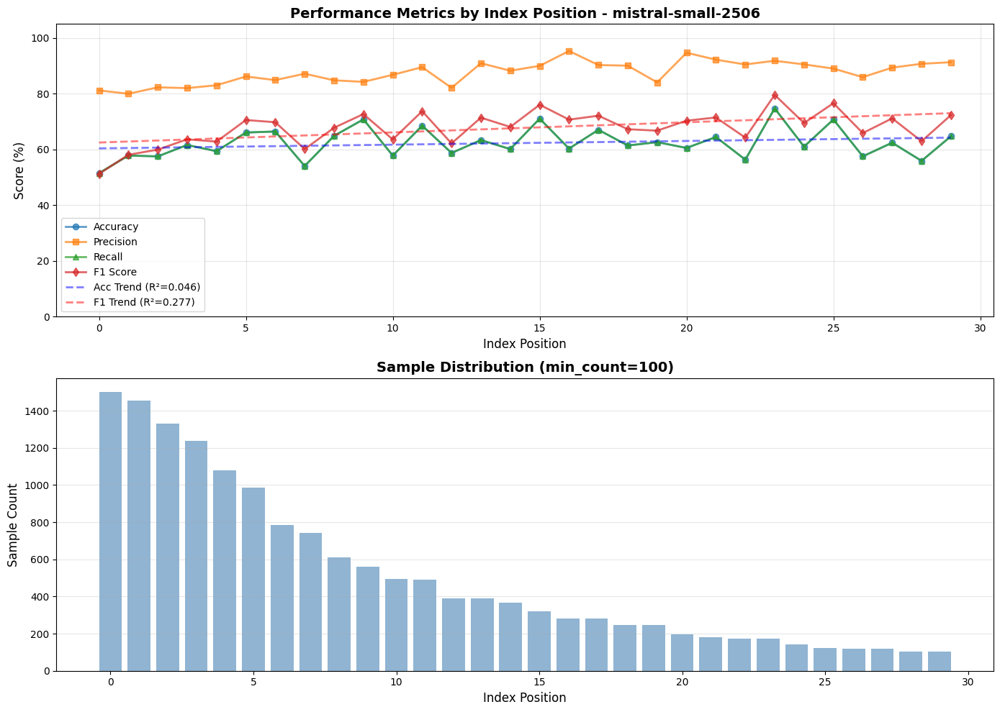

Saved: ./Full/plots2/mistral-small-2506_per_class_performance.png


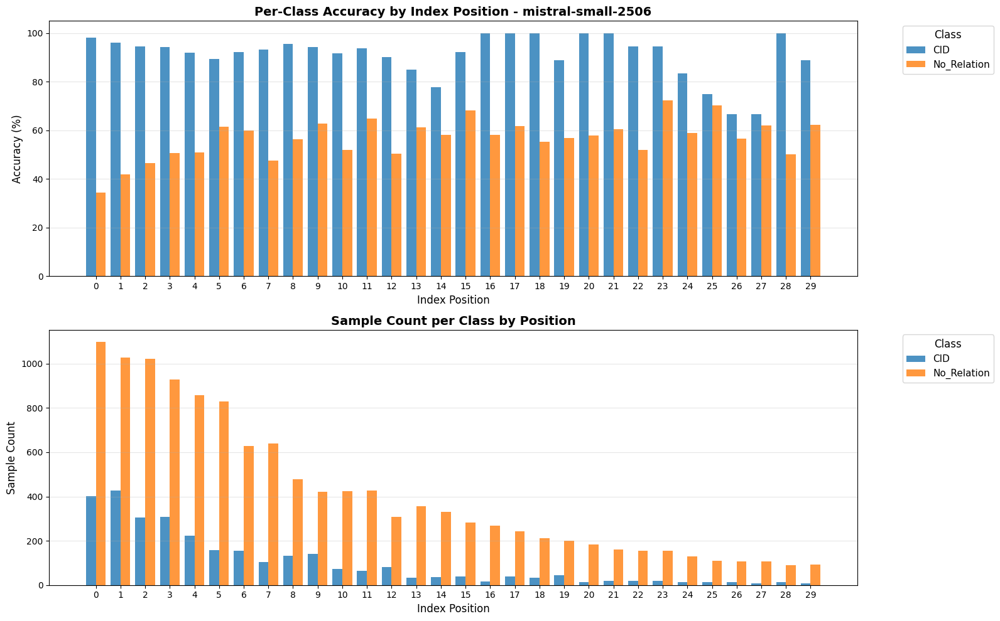


<mui:table-metadata title="Per-Class Accuracy by Position" />
| Position |        CID | No_Relatio |
|----------|------------|------------|
|        0 |  98.0%(402) |  34.4%(1098) |
|        1 |  96.0%(426) |  42.0%(1029) |
|        2 |  94.4%(306) |  46.4%(1023) |
|        3 |  94.2%(309) |  50.8%(930) |
|        4 |  91.9%(222) |  50.9%(858) |
|        5 |  89.3%(159) |  61.6%(828) |
|        6 |  92.3%(156) |  60.0%(627) |
|        7 |  93.3%(105) |  47.6%(639) |
|        8 |  95.5%(132) |  56.4%(477) |
|        9 |  94.3%(141) |  62.9%(420) |
|       10 |  91.7%(72) |  52.0%(423) |
|       11 |  93.7%(63) |  64.8%(426) |
|       12 |  90.1%(81) |  50.5%(309) |
|       13 |  84.8%(33) |  61.3%(357) |
|       14 |  77.8%(36) |  58.2%(330) |
|       15 |  92.3%(39) |  68.1%(282) |
|       16 | 100.0%(15) |  58.1%(267) |
|       17 | 100.0%(39) |  61.7%(243) |
|       18 | 100.0%(33) |  55.4%(213) |
|       19 |  88.9%(45) |  56.7%(201) |
|       20 | 100.0%(12) |  57.9%(183) |
|     

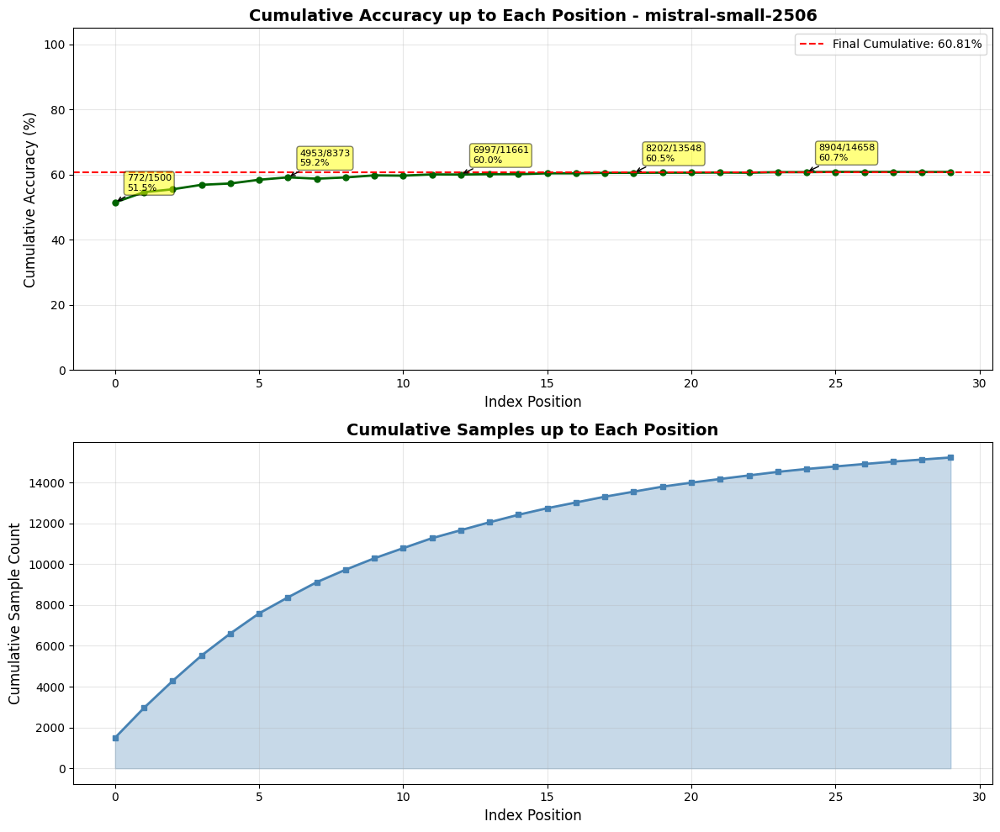


<mui:table-metadata title="Cumulative Accuracy by Position (Min Count: 100)" />
| Position | Cumulative Correct | Cumulative Total | Cumulative Accuracy |
|----------|-------------------|------------------|---------------------|
|        0 |               772 |             1500 |              51.47% |
|        1 |              1613 |             2955 |              54.59% |
|        2 |              2377 |             4284 |              55.49% |
|        3 |              3140 |             5523 |              56.85% |
|        4 |              3781 |             6603 |              57.26% |
|        5 |              4433 |             7590 |              58.41% |
|        6 |              4953 |             8373 |              59.15% |
|        7 |              5355 |             9117 |              58.74% |
|        8 |              5750 |             9726 |              59.12% |
|        9 |              6147 |            10287 |              59.76% |
|       10 |              6433

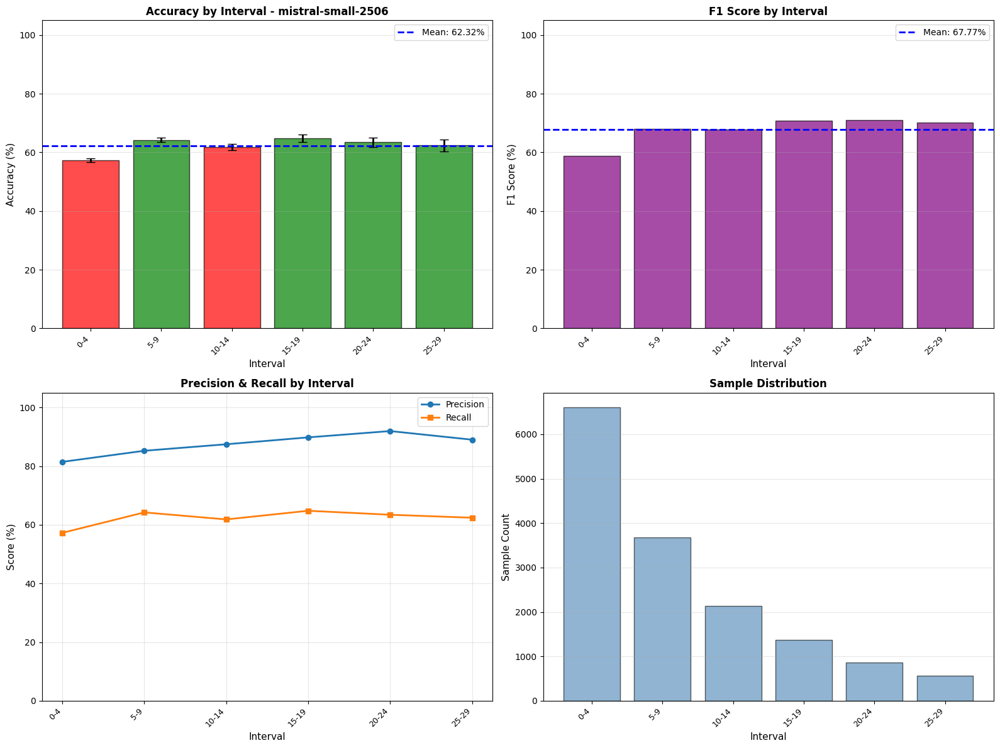

/tmp/ipykernel_87590/944485198.py:705: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved: ./Full/plots2/mistral-small-2506_class_distribution_comparison.png


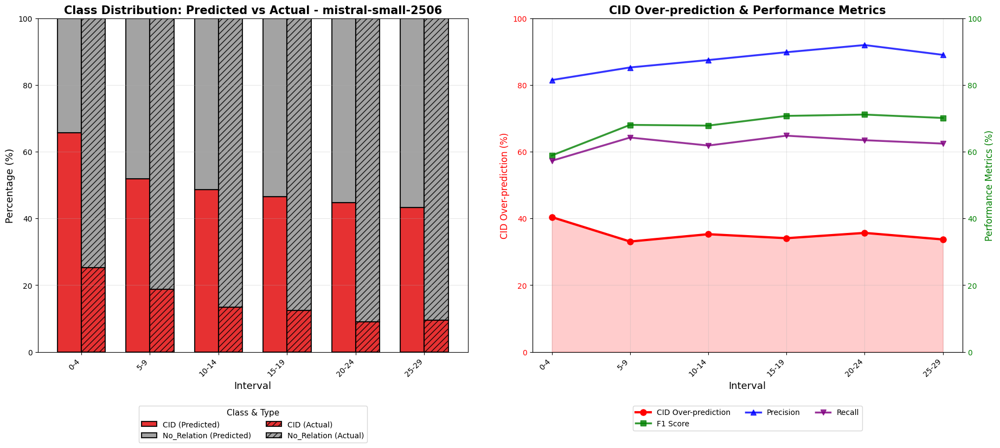


<mui:table-metadata title="Interval Analysis (size=5, min_count=100)" />
| Interval | Total | Accuracy | Precision | Recall | F1 Score | Std Error |
|----------|-------|----------|-----------|--------|----------|-----------|
| 0-4      |  6603 |   57.26% |    81.46% | 57.26% |   58.86% | ±    0.61% |
| 5-9      |  3684 |   64.22% |    85.23% | 64.22% |   68.02% | ±    0.79% |
| 10-14    |  2130 |   61.83% |    87.45% | 61.83% |   67.80% | ±    1.05% |
| 15-19    |  1377 |   64.78% |    89.79% | 64.78% |   70.71% | ±    1.29% |
| 20-24    |   864 |   63.43% |    91.94% | 63.43% |   71.11% | ±    1.64% |
| 25-29    |   564 |   62.41% |    89.00% | 62.41% |   70.09% | ±    2.04% |

Best F1 interval: 20-24 (71.11%)
Worst F1 interval: 0-4 (58.86%)

<mui:table-metadata title="Class Distribution Comparison by Interval" />
| Interval | Total |    CID_Pred |    CID_True | No_Rel_Pred | No_Rel_True |
|----------|-------|-----------|-----------|-----------|-----------|
| 0-4      |  6603 | 4331(

(['0-4', '5-9', '10-14', '15-19', '20-24', '25-29'],
 {'accuracy': [57.26185067393609,
   64.22366992399566,
   61.83098591549295,
   64.77850399419027,
   63.42592592592593,
   62.4113475177305],
  'precision': [81.45655518980216,
   85.22875305146839,
   87.44572280761996,
   89.79380199049317,
   91.9416622705911,
   89.00445805720265],
  'recall': [57.26185067393609,
   64.22366992399566,
   61.83098591549295,
   64.77850399419027,
   63.42592592592593,
   62.4113475177305],
  'f1': [58.86165791955926,
   68.01729231362641,
   67.80404756292694,
   70.71190112735997,
   71.10871647509578,
   70.09199155611451],
  'totals': [6603, 3684, 2130, 1377, 864, 564],
  'corrects': [3781, 2366, 1317, 892, 548, 352],
  'errors': [np.float64(0.6087933466332894),
   np.float64(0.7897427414613477),
   np.float64(1.0526130624690504),
   np.float64(1.2872188356811152),
   np.float64(1.6385632373135328),
   np.float64(2.0394854259902084)]},
 [{'CID': 4331, 'No_Relation': 2272},
  {'No_Relation': 17

In [6]:
import numpy as np
from collections import defaultdict
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report

def calculate_and_plot_index_effect(processed_results, Answers, min_count=3, prompt_type="multi_examples", save_dir=None):
    """
    Calculate average accuracy per index position across all runs.
    
    Args:
        processed_results: Dict with structure {n_X_run_Y: {prompt_type: {...}}}
        Answers: Dict with structure {n_X: {run_Y: {multi_relations: [...]}}}
        min_count: Minimum samples required for a position to be included
        prompt_type: Type of prompt to analyze (e.g., "multi_examples", "single_example")
        save_dir: Directory to save plots (if None, plots are only displayed)
    """
    # Extract model name
    model_name = "unknown_model"
    try:
        for key in processed_results.keys():
            if prompt_type in processed_results[key]:
                first_entry = list(processed_results[key][prompt_type].keys())[0]
                model_name = processed_results[key][prompt_type][first_entry]["model"]
                model_name = model_name.replace('mistral/', '', 1)
                break
    except Exception as e:
        print(f"Could not extract model name: {e}")
    
    # Aggregate data from all runs
    all_position_counts = defaultdict(int)
    all_correct_counts = defaultdict(int)
    all_position_predictions = defaultdict(list)  # Track predictions per position
    all_position_ground_truth = defaultdict(list)  # Track ground truth per position
    
    # Extract all n_X_run_Y combinations
    for key in processed_results.keys():
        if not key.startswith('n_') or prompt_type not in processed_results[key]:
            continue
            
        try:
            # Parse key to get n and run number (e.g., "n_1_run_1" -> n=1, run=1)
            parts = key.split('_')
            n_idx = int(parts[1])
            run_idx = int(parts[3])
            
            # Extract relations from processed results
            RL_list = []
            for entry in processed_results[key][prompt_type]:
                data = processed_results[key][prompt_type][entry]["contents"][0]
                relations = [relation['relation'] for relation in data.values()]
                RL_list.append(relations)
            
            # Get ground truth answers
            ground_truth = Answers[f"n_{n_idx}"][f"run_{run_idx}"]["multi_relations"]
            
            # Compare and accumulate counts
            position_counts, correct_counts = compare_lists(RL_list, ground_truth)
            
            for pos, count in position_counts.items():
                all_position_counts[pos] += count
                all_correct_counts[pos] += correct_counts.get(pos, 0)
            
            # Collect predictions and ground truth for metrics calculation
            for i, (pred_list, true_list) in enumerate(zip(RL_list, ground_truth)):
                for pos, (pred, true) in enumerate(zip(pred_list, true_list)):
                    all_position_predictions[pos].append(pred)
                    all_position_ground_truth[pos].append(true)
                
        except Exception as e:
            print(f"Error processing {key}: {e}")
            continue
    
    # Calculate metrics per position
    position_metrics = {}
    for pos in all_position_counts:
        if all_position_counts[pos] >= min_count:
            y_true = all_position_ground_truth[pos]
            y_pred = all_position_predictions[pos]
            
            # Get all unique labels for averaging
            labels = sorted(list(set(y_true + y_pred)))
            
            position_metrics[pos] = {
                'accuracy': (all_correct_counts[pos] / all_position_counts[pos]) * 100,
                'precision': precision_score(y_true, y_pred, average='weighted', zero_division=0) * 100,
                'recall': recall_score(y_true, y_pred, average='weighted', zero_division=0) * 100,
                'f1': f1_score(y_true, y_pred, average='weighted', zero_division=0) * 100,
            }
    
    # Print summary statistics
    print_summary_statistics_with_metrics(all_position_counts, all_correct_counts, position_metrics, 
                                         all_position_ground_truth, all_position_predictions, min_count)
    
    # Plot metrics by position
    plot_metrics_by_position(position_metrics, all_position_counts, min_count, model_name, save_dir)
    
    # Plot per-class performance
    plot_per_class_performance(all_position_predictions, all_position_ground_truth, 
                               all_position_counts, min_count, model_name, save_dir)
    
    # Plot cumulative accuracy
    plot_cumulative_accuracy(all_position_counts, all_correct_counts, min_count, model_name, save_dir)
    
    return position_metrics, all_position_counts, all_correct_counts, all_position_predictions, all_position_ground_truth, model_name


def print_summary_statistics_with_metrics(position_counts, correct_counts, position_metrics, 
                                         position_ground_truth, position_predictions, min_count):
    """Print detailed statistics table with F1, precision, and recall."""
    # Overall metrics
    all_true = []
    all_pred = []
    for pos in position_metrics.keys():
        all_true.extend(position_ground_truth[pos])
        all_pred.extend(position_predictions[pos])
    
    total_correct = sum(correct_counts.values())
    total_samples = sum(position_counts.values())
    overall_accuracy = (total_correct / total_samples * 100) if total_samples > 0 else 0
    overall_precision = precision_score(all_true, all_pred, average='weighted', zero_division=0) * 100
    overall_recall = recall_score(all_true, all_pred, average='weighted', zero_division=0) * 100
    overall_f1 = f1_score(all_true, all_pred, average='weighted', zero_division=0) * 100
    
    print(f"\n=== Overall Performance ===")
    print(f"Accuracy:  {overall_accuracy:.2f}% ({total_correct}/{total_samples})")
    print(f"Precision: {overall_precision:.2f}%")
    print(f"Recall:    {overall_recall:.2f}%")
    print(f"F1 Score:  {overall_f1:.2f}%")
    print(f"Positions analyzed (min_count={min_count}): {len(position_metrics)}")
    
    # Print classification report
    print(f"\n=== Classification Report (Overall) ===")
    print(classification_report(all_true, all_pred, zero_division=0))
    
    # Detailed table by position
    sorted_positions = sorted(position_metrics.keys())
    
    print(f"\n<mui:table-metadata title=\"Metrics by Index Position (Min Count: {min_count})\" />")
    print("| Position | Count | Accuracy | Precision | Recall | F1 Score |")
    print("|----------|-------|----------|-----------|--------|----------|")
    
    for pos in sorted_positions:
        count = position_counts[pos]
        metrics = position_metrics[pos]
        print(f"| {pos:8d} | {count:5d} | {metrics['accuracy']:7.2f}% | {metrics['precision']:8.2f}% | {metrics['recall']:5.2f}% | {metrics['f1']:7.2f}% |")


def plot_metrics_by_position(position_metrics, position_counts, min_count, model_name, save_dir=None):
    """Plot accuracy, precision, recall, and F1 by position with trend lines."""
    import matplotlib.pyplot as plt
    import os
    from scipy import stats

    model_name = model_name.replace('mistral/', '', 1)
    sorted_positions = sorted(position_metrics.keys())
    accuracies = [position_metrics[pos]['accuracy'] for pos in sorted_positions]
    precisions = [position_metrics[pos]['precision'] for pos in sorted_positions]
    recalls = [position_metrics[pos]['recall'] for pos in sorted_positions]
    f1_scores = [position_metrics[pos]['f1'] for pos in sorted_positions]
    counts = [position_counts[pos] for pos in sorted_positions]
    
    # Calculate trend lines
    slope_acc, intercept_acc, r_acc, _, _ = stats.linregress(sorted_positions, accuracies)
    slope_f1, intercept_f1, r_f1, _, _ = stats.linregress(sorted_positions, f1_scores)
    trend_acc = [slope_acc * pos + intercept_acc for pos in sorted_positions]
    trend_f1 = [slope_f1 * pos + intercept_f1 for pos in sorted_positions]
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))
    
    # Plot 1: All metrics
    ax1.plot(sorted_positions, accuracies, marker='o', linestyle='-', linewidth=2, label='Accuracy', alpha=0.7)
    ax1.plot(sorted_positions, precisions, marker='s', linestyle='-', linewidth=2, label='Precision', alpha=0.7)
    ax1.plot(sorted_positions, recalls, marker='^', linestyle='-', linewidth=2, label='Recall', alpha=0.7)
    ax1.plot(sorted_positions, f1_scores, marker='d', linestyle='-', linewidth=2, label='F1 Score', alpha=0.7)
    ax1.plot(sorted_positions, trend_acc, '--', color='blue', linewidth=2, alpha=0.5, 
             label=f'Acc Trend (R²={r_acc**2:.3f})')
    ax1.plot(sorted_positions, trend_f1, '--', color='red', linewidth=2, alpha=0.5,
             label=f'F1 Trend (R²={r_f1**2:.3f})')
    
    ax1.set_xlabel('Index Position', fontsize=12)
    ax1.set_ylabel('Score (%)', fontsize=12)
    ax1.set_title(f'Performance Metrics by Index Position - {model_name}', fontsize=14, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='best')
    ax1.set_ylim(0, 105)
    
    # Plot 2: Sample counts
    ax2.bar(sorted_positions, counts, alpha=0.6, color='steelblue')
    ax2.set_xlabel('Index Position', fontsize=12)
    ax2.set_ylabel('Sample Count', fontsize=12)
    ax2.set_title(f'Sample Distribution (min_count={min_count})', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        filename = f"{model_name}_metrics_by_position.png"
        filepath = os.path.join(save_dir, filename)
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
        print(f"Saved: {filepath}")
    
    plt.show()


def plot_per_class_performance(position_predictions, position_ground_truth, position_counts, min_count, model_name, save_dir=None):
    """Plot performance per class at each index position."""
    import matplotlib.pyplot as plt
    import os
    
    # Get all unique classes
    all_classes = set()
    for pos in position_predictions.keys():
        all_classes.update(position_predictions[pos])
        all_classes.update(position_ground_truth[pos])
    all_classes = sorted(list(all_classes))
    
    # Filter positions by min_count
    valid_positions = sorted([pos for pos, count in position_counts.items() if count >= min_count])
    
    # Calculate per-class accuracy at each position
    class_accuracies = {cls: [] for cls in all_classes}
    class_counts = {cls: [] for cls in all_classes}
    
    for pos in valid_positions:
        y_true = position_ground_truth[pos]
        y_pred = position_predictions[pos]
        
        for cls in all_classes:
            # Get indices where true label is this class
            cls_indices = [i for i, true_label in enumerate(y_true) if true_label == cls]
            
            if len(cls_indices) > 0:
                # Calculate accuracy for this class at this position
                correct = sum(1 for i in cls_indices if y_pred[i] == cls)
                accuracy = (correct / len(cls_indices)) * 100
                class_accuracies[cls].append(accuracy)
                class_counts[cls].append(len(cls_indices))
            else:
                class_accuracies[cls].append(np.nan)  # No samples of this class
                class_counts[cls].append(0)
    
    # Create grouped bar chart
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))
    
    x = np.arange(len(valid_positions))
    width = 0.8 / len(all_classes)  # Width of bars
    
    # Plot 1: Per-class accuracy
    for i, cls in enumerate(all_classes):
        offset = width * (i - len(all_classes)/2 + 0.5)
        accuracies = class_accuracies[cls]
        ax1.bar(x + offset, accuracies, width, label=cls, alpha=0.8)
    
    ax1.set_xlabel('Index Position', fontsize=12)
    ax1.set_ylabel('Accuracy (%)', fontsize=12)
    ax1.set_title(f'Per-Class Accuracy by Index Position - {model_name}', fontsize=14, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(valid_positions)
    ax1.legend(title='Class', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11, title_fontsize=12)
    ax1.grid(True, alpha=0.3, axis='y')
    ax1.set_ylim(0, 105)
    
    # Plot 2: Sample counts per class
    for i, cls in enumerate(all_classes):
        offset = width * (i - len(all_classes)/2 + 0.5)
        counts = class_counts[cls]
        ax2.bar(x + offset, counts, width, label=cls, alpha=0.8)
    
    ax2.set_xlabel('Index Position', fontsize=12)
    ax2.set_ylabel('Sample Count', fontsize=12)
    ax2.set_title('Sample Count per Class by Position', fontsize=14, fontweight='bold')
    ax2.set_xticks(x)
    ax2.set_xticklabels(valid_positions)
    ax2.legend(title='Class', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11, title_fontsize=12)
    ax2.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        filename = f"{model_name}_per_class_performance.png"
        filepath = os.path.join(save_dir, filename)
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
        print(f"Saved: {filepath}")
    
    plt.show()
    
    # Print per-class accuracy table
    print(f"\n<mui:table-metadata title=\"Per-Class Accuracy by Position\" />")
    header = "| Position |"
    separator = "|----------|"
    for cls in all_classes:
        header += f" {cls[:10]:>10s} |"
        separator += "------------|"
    print(header)
    print(separator)
    
    for i, pos in enumerate(valid_positions):
        row = f"| {pos:8d} |"
        for cls in all_classes:
            acc = class_accuracies[cls][i]
            count = class_counts[cls][i]
            if not np.isnan(acc):
                row += f" {acc:5.1f}%({count:2d}) |"
            else:
                row += f"      -     |"
        print(row)


def plot_cumulative_accuracy(position_counts, correct_counts, min_count, model_name, save_dir=None):
    """Plot cumulative accuracy up to each index position."""
    import matplotlib.pyplot as plt
    import os
    
    # Filter and sort positions
    sorted_positions = sorted([pos for pos, count in position_counts.items() if count >= min_count])
    
    # Calculate cumulative counts and accuracy
    cumulative_total = 0
    cumulative_correct = 0
    cumulative_accuracies = []
    cumulative_totals = []
    cumulative_corrects = []
    
    for pos in sorted_positions:
        cumulative_total += position_counts[pos]
        cumulative_correct += correct_counts.get(pos, 0)
        cumulative_accuracy = (cumulative_correct / cumulative_total * 100) if cumulative_total > 0 else 0
        
        cumulative_accuracies.append(cumulative_accuracy)
        cumulative_totals.append(cumulative_total)
        cumulative_corrects.append(cumulative_correct)
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))
    
    # Plot 1: Cumulative accuracy
    ax1.plot(sorted_positions, cumulative_accuracies, marker='o', linestyle='-', 
             linewidth=2, markersize=5, color='darkgreen')
    ax1.axhline(y=cumulative_accuracies[-1], color='r', linestyle='--', 
                label=f'Final Cumulative: {cumulative_accuracies[-1]:.2f}%')
    ax1.set_xlabel('Index Position', fontsize=12)
    ax1.set_ylabel('Cumulative Accuracy (%)', fontsize=12)
    ax1.set_title(f'Cumulative Accuracy up to Each Position - {model_name}', fontsize=14, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    ax1.set_ylim(0, 105)
    
    # Add annotations for key points
    for i in range(0, len(sorted_positions), max(1, len(sorted_positions)//5)):
        pos = sorted_positions[i]
        acc = cumulative_accuracies[i]
        correct = cumulative_corrects[i]
        total = cumulative_totals[i]
        ax1.annotate(f'{correct}/{total}\n{acc:.1f}%', 
                    xy=(pos, acc), xytext=(10, 10),
                    textcoords='offset points', fontsize=8,
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.5),
                    arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0'))
    
    # Plot 2: Cumulative sample count
    ax2.plot(sorted_positions, cumulative_totals, marker='s', linestyle='-', 
             linewidth=2, markersize=4, color='steelblue')
    ax2.fill_between(sorted_positions, cumulative_totals, alpha=0.3, color='steelblue')
    ax2.set_xlabel('Index Position', fontsize=12)
    ax2.set_ylabel('Cumulative Sample Count', fontsize=12)
    ax2.set_title('Cumulative Samples up to Each Position', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        filename = f"{model_name}_cumulative_accuracy.png"
        filepath = os.path.join(save_dir, filename)
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
        print(f"Saved: {filepath}")
    
    plt.show()
    
    # Print cumulative accuracy table
    print(f"\n<mui:table-metadata title=\"Cumulative Accuracy by Position (Min Count: {min_count})\" />")
    print("| Position | Cumulative Correct | Cumulative Total | Cumulative Accuracy |")
    print("|----------|-------------------|------------------|---------------------|")
    for i, pos in enumerate(sorted_positions):
        print(f"| {pos:8d} | {cumulative_corrects[i]:17d} | {cumulative_totals[i]:16d} | {cumulative_accuracies[i]:18.2f}% |")
    
    return cumulative_accuracies, cumulative_totals, cumulative_corrects


def analyze_intervals(position_counts, correct_counts, position_predictions, position_ground_truth, 
                     min_count=3, interval_size=10, model_name="unknown_model", save_dir=None):
    """
    Analyze all metrics across intervals to find well-performing ranges.
    
    Args:
        position_counts: Dict of position -> count
        correct_counts: Dict of position -> correct count
        position_predictions: Dict of position -> list of predictions
        position_ground_truth: Dict of position -> list of true labels
        min_count: Minimum samples for a position
        interval_size: Size of each interval to analyze
        model_name: Name of the model being analyzed
        save_dir: Directory to save plots (if None, plots are only displayed)
    """
    import matplotlib.pyplot as plt
    import os
    
    model_name = model_name.replace('mistral/', '', 1)
    sorted_positions = sorted([pos for pos, count in position_counts.items() if count >= min_count])
    
    if not sorted_positions:
        print("No positions meet minimum count requirement")
        return
    
    # Create intervals
    min_pos = sorted_positions[0]
    max_pos = sorted_positions[-1]
    
    intervals = []
    interval_metrics = {
        'accuracy': [], 'precision': [], 'recall': [], 'f1': [],
        'totals': [], 'corrects': [], 'errors': []
    }
    interval_pred_distributions = []  # Predicted label distributions
    interval_true_distributions = []  # Actual label distributions
    
    current_start = min_pos
    while current_start <= max_pos:
        current_end = current_start + interval_size - 1
        
        # Get positions in this interval
        positions_in_interval = [p for p in sorted_positions if current_start <= p <= current_end]
        
        if positions_in_interval:
            # Aggregate predictions and ground truth
            interval_pred = []
            interval_true = []
            for pos in positions_in_interval:
                if pos in position_predictions and pos in position_ground_truth:
                    interval_pred.extend(position_predictions[pos])
                    interval_true.extend(position_ground_truth[pos])
            
            total = len(interval_true)
            correct = sum(1 for p, t in zip(interval_pred, interval_true) if p == t)
            
            if total > 0:
                # Calculate metrics
                accuracy = (correct / total) * 100
                precision = precision_score(interval_true, interval_pred, average='weighted', zero_division=0) * 100
                recall = recall_score(interval_true, interval_pred, average='weighted', zero_division=0) * 100
                f1 = f1_score(interval_true, interval_pred, average='weighted', zero_division=0) * 100
                
                # Standard error
                p = correct / total
                std_error = np.sqrt(p * (1 - p) / total) * 100
                
                # Predicted class distribution
                pred_dist = {}
                for label in interval_pred:
                    pred_dist[label] = pred_dist.get(label, 0) + 1
                
                # Actual class distribution
                true_dist = {}
                for label in interval_true:
                    true_dist[label] = true_dist.get(label, 0) + 1
                
                interval_label = f"{current_start}-{current_end}"
                intervals.append(interval_label)
                interval_metrics['accuracy'].append(accuracy)
                interval_metrics['precision'].append(precision)
                interval_metrics['recall'].append(recall)
                interval_metrics['f1'].append(f1)
                interval_metrics['totals'].append(total)
                interval_metrics['corrects'].append(correct)
                interval_metrics['errors'].append(std_error)
                interval_pred_distributions.append(pred_dist)
                interval_true_distributions.append(true_dist)
        
        current_start += interval_size
    
    # Create visualization
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
    
    x_pos = range(len(intervals))
    
    # Plot 1: Accuracy with error bars
    colors = ['green' if acc >= np.mean(interval_metrics['accuracy']) else 'red' 
              for acc in interval_metrics['accuracy']]
    ax1.bar(x_pos, interval_metrics['accuracy'], color=colors, alpha=0.7, edgecolor='black',
            yerr=interval_metrics['errors'], capsize=5, error_kw={'linewidth': 2, 'ecolor': 'black'})
    ax1.axhline(y=np.mean(interval_metrics['accuracy']), color='blue', linestyle='--', 
                linewidth=2, label=f'Mean: {np.mean(interval_metrics["accuracy"]):.2f}%')
    ax1.set_xlabel('Interval', fontsize=11)
    ax1.set_ylabel('Accuracy (%)', fontsize=11)
    ax1.set_title(f'Accuracy by Interval - {model_name}', fontsize=12, fontweight='bold')
    ax1.set_xticks(x_pos)
    ax1.set_xticklabels(intervals, rotation=45, ha='right', fontsize=9)
    ax1.grid(True, alpha=0.3, axis='y')
    ax1.legend()
    ax1.set_ylim(0, 105)
    
    # Plot 2: F1 Score
    ax2.bar(x_pos, interval_metrics['f1'], alpha=0.7, color='purple', edgecolor='black')
    ax2.axhline(y=np.mean(interval_metrics['f1']), color='blue', linestyle='--', 
                linewidth=2, label=f'Mean: {np.mean(interval_metrics["f1"]):.2f}%')
    ax2.set_xlabel('Interval', fontsize=11)
    ax2.set_ylabel('F1 Score (%)', fontsize=11)
    ax2.set_title('F1 Score by Interval', fontsize=12, fontweight='bold')
    ax2.set_xticks(x_pos)
    ax2.set_xticklabels(intervals, rotation=45, ha='right', fontsize=9)
    ax2.grid(True, alpha=0.3, axis='y')
    ax2.legend()
    ax2.set_ylim(0, 105)
    
    # Plot 3: Precision and Recall
    ax3.plot(x_pos, interval_metrics['precision'], marker='o', label='Precision', linewidth=2)
    ax3.plot(x_pos, interval_metrics['recall'], marker='s', label='Recall', linewidth=2)
    ax3.set_xlabel('Interval', fontsize=11)
    ax3.set_ylabel('Score (%)', fontsize=11)
    ax3.set_title('Precision & Recall by Interval', fontsize=12, fontweight='bold')
    ax3.set_xticks(x_pos)
    ax3.set_xticklabels(intervals, rotation=45, ha='right', fontsize=9)
    ax3.grid(True, alpha=0.3)
    ax3.legend()
    ax3.set_ylim(0, 105)
    
    # Plot 4: Sample counts
    ax4.bar(x_pos, interval_metrics['totals'], alpha=0.6, color='steelblue', edgecolor='black')
    ax4.set_xlabel('Interval', fontsize=11)
    ax4.set_ylabel('Sample Count', fontsize=11)
    ax4.set_title('Sample Distribution', fontsize=12, fontweight='bold')
    ax4.set_xticks(x_pos)
    ax4.set_xticklabels(intervals, rotation=45, ha='right', fontsize=9)
    ax4.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        filename = f"{model_name}_interval_metrics.png"
        filepath = os.path.join(save_dir, filename)
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
        print(f"Saved: {filepath}")
    
    plt.show()
    
    # Plot class distributions (both predicted and actual)
    plot_class_distributions_comparison(intervals, interval_pred_distributions, 
                                       interval_true_distributions, interval_metrics['totals'],
                                       model_name, save_dir, 
                                       f1_scores=interval_metrics['f1'],
                                       precision=interval_metrics['precision'],
                                       recall=interval_metrics['recall'])
    
    # Print interval analysis table
    print(f"\n<mui:table-metadata title=\"Interval Analysis (size={interval_size}, min_count={min_count})\" />")
    print("| Interval | Total | Accuracy | Precision | Recall | F1 Score | Std Error |")
    print("|----------|-------|----------|-----------|--------|----------|-----------|")
    
    for i, interval in enumerate(intervals):
        print(f"| {interval:8s} | {interval_metrics['totals'][i]:5d} | "
              f"{interval_metrics['accuracy'][i]:7.2f}% | {interval_metrics['precision'][i]:8.2f}% | "
              f"{interval_metrics['recall'][i]:5.2f}% | {interval_metrics['f1'][i]:7.2f}% | "
              f"±{interval_metrics['errors'][i]:8.2f}% |")
    
    print(f"\nBest F1 interval: {intervals[np.argmax(interval_metrics['f1'])]} "
          f"({max(interval_metrics['f1']):.2f}%)")
    print(f"Worst F1 interval: {intervals[np.argmin(interval_metrics['f1'])]} "
          f"({min(interval_metrics['f1']):.2f}%)")
    
    # Print class distributions comparison
    print(f"\n<mui:table-metadata title=\"Class Distribution Comparison by Interval\" />")
    print_class_distribution_comparison_table(intervals, interval_pred_distributions, 
                                             interval_true_distributions, interval_metrics['totals'])
    
    return intervals, interval_metrics, interval_pred_distributions, interval_true_distributions
 


def plot_class_distributions_comparison(intervals, pred_distributions, true_distributions, interval_totals, model_name, save_dir=None, f1_scores=None, precision=None, recall=None):
    """Plot stacked bar comparison of predicted vs actual class distributions with CID difference subplot."""
    import matplotlib.pyplot as plt
    import os
    
    # Get all unique classes
    all_classes = set()
    for dist in pred_distributions + true_distributions:
        all_classes.update(dist.keys())
    all_classes = sorted(all_classes)
    
    if not all_classes:
        print("No class distribution data available")
        return
    
    # Prepare data for stacked bars
    pred_percentages = {cls: [] for cls in all_classes}
    true_percentages = {cls: [] for cls in all_classes}
    
    for pred_dist, true_dist, total in zip(pred_distributions, true_distributions, interval_totals):
        for cls in all_classes:
            pred_count = pred_dist.get(cls, 0)
            true_count = true_dist.get(cls, 0)
            pred_percentages[cls].append((pred_count / total * 100) if total > 0 else 0)
            true_percentages[cls].append((true_count / total * 100) if total > 0 else 0)
    
    # Calculate CID over-prediction (only positive: predicted > actual)
    cid_over_pred = []
    if 'CID' in pred_percentages and 'CID' in true_percentages:
        for pred_pct, true_pct in zip(pred_percentages['CID'], true_percentages['CID']):
            over_pred = max(0, pred_pct - true_pct)  # Only positive values
            cid_over_pred.append(over_pred)
    # Create figure with 2 subplots side by side
    fig = plt.figure(figsize=(22, 8))
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 1], wspace=0.15)
    ax1 = fig.add_subplot(gs[0])
    ax2 = fig.add_subplot(gs[1])
    
    # ========== SUBPLOT 1: Stacked Bar Chart ==========
    x = np.arange(len(intervals))
    width = 0.35  # Width of each bar
    
    # Use complementary colors for classes
    n_classes = len(all_classes)
    base_colors = plt.cm.Set1(np.linspace(0, 1, n_classes))
    
    # Plot predicted (left bar, solid)
    bottom_pred = np.zeros(len(intervals))
    for i, cls in enumerate(all_classes):
        ax1.bar(x - width/2, pred_percentages[cls], width, bottom=bottom_pred,
               label=f'{cls} (Predicted)', alpha=0.9, edgecolor='black', 
               color=base_colors[i], linewidth=1.5)
        bottom_pred += pred_percentages[cls]
    
    # Plot actual (right bar, striped)
    bottom_true = np.zeros(len(intervals))
    for i, cls in enumerate(all_classes):
        ax1.bar(x + width/2, true_percentages[cls], width, bottom=bottom_true,
               label=f'{cls} (Actual)', alpha=0.9, edgecolor='black',
               color=base_colors[i], hatch='///', linewidth=1.5)
        bottom_true += true_percentages[cls]
    
    ax1.set_xlabel('Interval', fontsize=13)
    ax1.set_ylabel('Percentage (%)', fontsize=13)
    ax1.set_title(f'Class Distribution: Predicted vs Actual - {model_name}', fontsize=15, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(intervals, rotation=45, ha='right')
    ax1.legend(title='Class & Type', loc='upper center', bbox_to_anchor=(0.5, -0.15), fontsize=10, title_fontsize=11, ncol=2)
    ax1.grid(True, alpha=0.3, axis='y')
    ax1.set_ylim(0, 100)
    
    # ========== SUBPLOT 2: CID Over-Prediction with F1 Score Overlay ==========
    if cid_over_pred:
        # Plot CID over-prediction on primary y-axis (0-100 range)
        ax2.plot(x, cid_over_pred, color='red', linewidth=3, marker='o',
                markersize=8, label='CID Over-prediction', zorder=3)
        ax2.fill_between(x, cid_over_pred, 0, alpha=0.2, color='red', zorder=1)
        
        
        # Set labels for primary axis
        ax2.set_xlabel('Interval', fontsize=13)
        ax2.set_ylabel('CID Over-prediction (%)', fontsize=12, color='red')
        ax2.tick_params(axis='y', labelcolor='red')
        ax2.set_ylim(0, 100)  # CID over-prediction from 0 to 100
        
        # Create twin axis for F1 scores
        ax2_f1 = ax2.twinx()
        
        # Plot performance metrics on secondary y-axis (0 at bottom, 100 at top)
        if f1_scores is not None and len(f1_scores) == len(intervals):
            # Convert to numpy arrays for safety
            f1_array = np.array(f1_scores)
            
            ax2_f1.plot(x, f1_array, color='green', linewidth=2.5, marker='s',
                       markersize=7, label='F1 Score', alpha=0.8, zorder=4)
            
        if precision is not None and len(precision) == len(intervals):
            prec_array = np.array(precision)
            ax2_f1.plot(x, prec_array, color='blue', linewidth=2.5, marker='^',
                       markersize=7, label='Precision', alpha=0.8, zorder=4)
            
        if recall is not None and len(recall) == len(intervals):
            rec_array = np.array(recall)
            ax2_f1.plot(x, rec_array, color='purple', linewidth=2.5, marker='v',
                       markersize=7, label='Recall', alpha=0.8, zorder=4)
            
            ax2_f1.set_ylabel('Performance Metrics (%)', fontsize=12, color='green')
            ax2_f1.tick_params(axis='y', labelcolor='green')
            ax2_f1.set_ylim(0, 100)  # Inverted: 0 at top, 100 at bottom
        
        ax2.set_title('CID Over-prediction & Performance Metrics', fontsize=15, fontweight='bold')
        ax2.set_xticks(x)
        ax2.set_xticklabels(intervals, rotation=45, ha='right')
        
        # Combine legends
        lines1, labels1 = ax2.get_legend_handles_labels()
        if f1_scores is not None:
            lines2, labels2 = ax2_f1.get_legend_handles_labels()
            ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.15), fontsize=10, ncol=3)
        else:
            ax2.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fontsize=10, ncol=3)
        
        ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        filename = f"{model_name}_class_distribution_comparison.png"
        filepath = os.path.join(save_dir, filename)
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
        print(f"Saved: {filepath}")
    
    plt.show()
def print_class_distribution_comparison_table(intervals, pred_distributions, true_distributions, interval_totals):
    """Print detailed table comparing predicted vs actual class distributions."""
    all_classes = set()
    for dist in pred_distributions + true_distributions:
        all_classes.update(dist.keys())
    all_classes = sorted(all_classes)
    
    if not all_classes:
        return
    
    # Print header
    header = "| Interval | Total |"
    separator = "|----------|-------|"
    for cls in all_classes:
        header += f" {cls[:6]:>6s}_Pred | {cls[:6]:>6s}_True |"
        separator += "-----------|-----------|"
    
    print(header)
    print(separator)
    
    # Print rows
    for interval, pred_dist, true_dist, total in zip(intervals, pred_distributions, true_distributions, interval_totals):
        row = f"| {interval:8s} | {total:5d} |"
        for cls in all_classes:
            pred_count = pred_dist.get(cls, 0)
            true_count = true_dist.get(cls, 0)
            pred_pct = (pred_count / total * 100) if total > 0 else 0
            true_pct = (true_count / total * 100) if total > 0 else 0
            row += f" {pred_count:3d}({pred_pct:4.1f}%) | {true_count:3d}({true_pct:4.1f}%) |"
        print(row)


# Example usage:
position_metrics, counts, correct, predictions, ground_truth, model_name = calculate_and_plot_index_effect(
    #  processed_results, Answers, min_count=20, prompt_type="multi_examples", save_dir="LLM_benchmarks/Results/CID/Full/plots"
     processed_results, Answers, min_count=100, prompt_type="multi_examples", save_dir="./Full/plots2"
 )
#
# Analyze intervals with all metrics, error bars, and class distributions:
analyze_intervals(counts, correct, predictions, ground_truth, 
                #   min_count=20, interval_size=5, model_name=model_name, save_dir="LLM_benchmarks/Results/CID/Full/plots")
                  min_count=100, interval_size=5, model_name=model_name, save_dir="./Full/plots2")
#
# Or call cumulative plot separately:
#plot_cumulative_accuracy(counts, correct, min_count=3, model_name=model_name, save_dir="./plots")


=== Overall Performance ===
Accuracy:  65.47% (10970/16755)
Precision: 83.14%
Recall:    62.36%
F1 Score:  65.33%
Positions analyzed (min_count=200): 20

=== Classification Report (Overall) ===
              precision    recall  f1-score   support

         CID       0.36      0.93      0.52      3015
 No_Relation       0.96      0.54      0.69     10779

    accuracy                           0.62     13794
   macro avg       0.66      0.73      0.60     13794
weighted avg       0.83      0.62      0.65     13794


<mui:table-metadata title="Metrics by Index Position (Min Count: 200)" />
| Position | Count | Accuracy | Precision | Recall | F1 Score |
|----------|-------|----------|-----------|--------|----------|
|        0 |  1500 |   57.00% |    73.55% | 57.00% |   49.75% |
|        1 |  1455 |   52.78% |    78.17% | 52.78% |   52.75% |
|        2 |  1329 |   55.91% |    77.51% | 55.91% |   56.42% |
|        3 |  1239 |   56.01% |    79.40% | 56.01% |   57.84% |
|        4 |  1080 

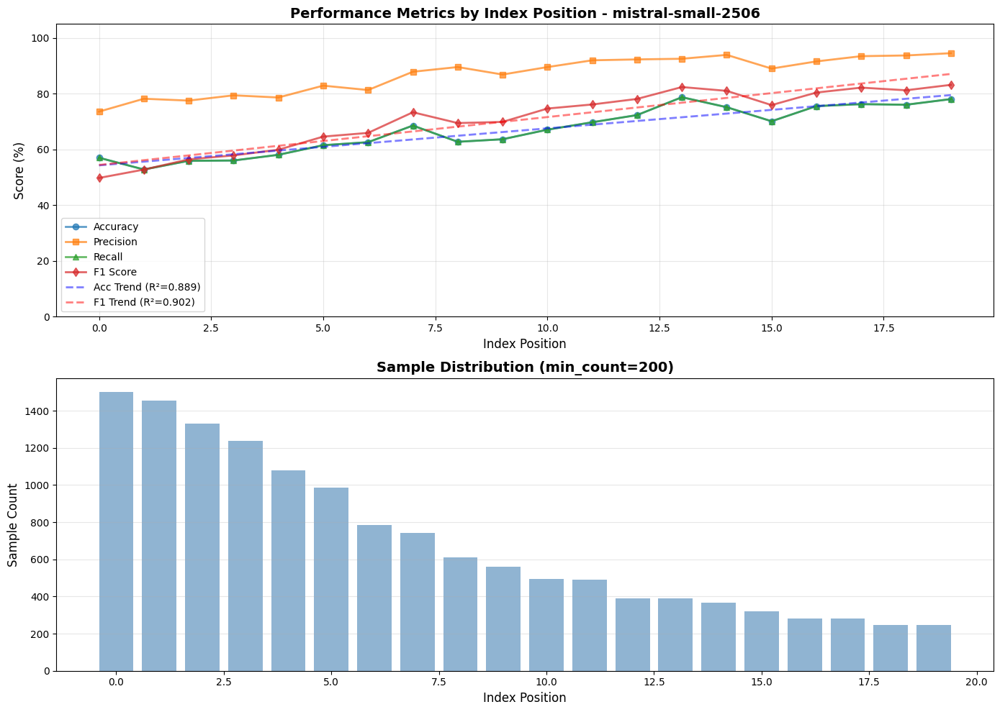

Saved: ./Full/plots2/mistral-small-2506_per_class_performance.png


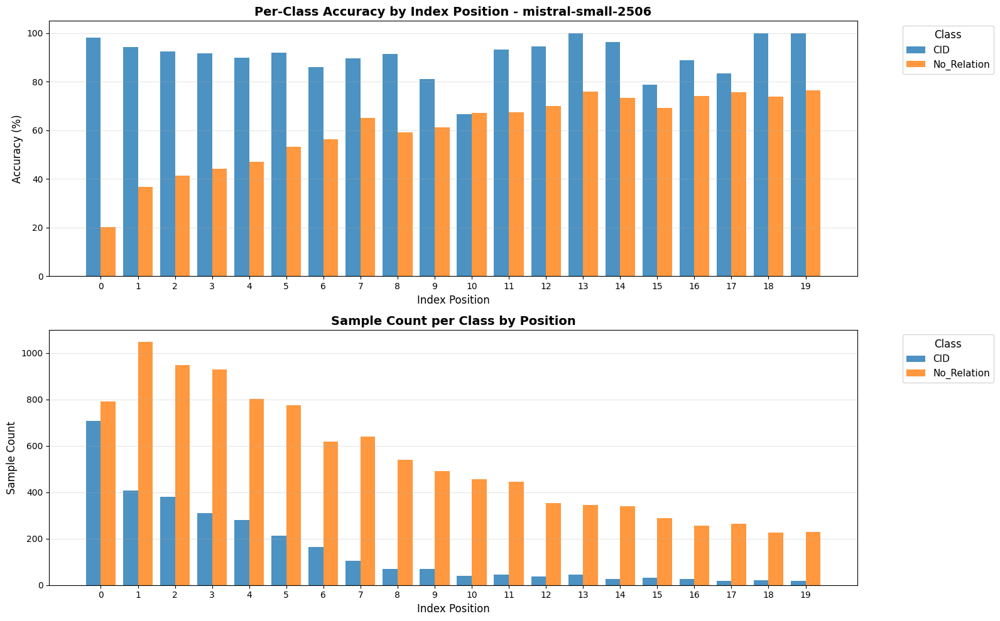


<mui:table-metadata title="Per-Class Accuracy by Position" />
| Position |        CID | No_Relatio |
|----------|------------|------------|
|        0 |  98.2%(708) |  20.2%(792) |
|        1 |  94.4%(408) |  36.6%(1047) |
|        2 |  92.4%(381) |  41.2%(948) |
|        3 |  91.6%(309) |  44.2%(930) |
|        4 |  90.0%(279) |  46.9%(801) |
|        5 |  92.0%(213) |  53.1%(774) |
|        6 |  86.1%(165) |  56.3%(618) |
|        7 |  89.5%(105) |  65.1%(639) |
|        8 |  91.3%(69) |  59.1%(540) |
|        9 |  81.2%(69) |  61.2%(492) |
|       10 |  66.7%(39) |  67.1%(456) |
|       11 |  93.3%(45) |  67.3%(444) |
|       12 |  94.4%(36) |  70.1%(354) |
|       13 | 100.0%(45) |  75.9%(345) |
|       14 |  96.3%(27) |  73.5%(339) |
|       15 |  78.8%(33) |  69.1%(288) |
|       16 |  88.9%(27) |  74.1%(255) |
|       17 |  83.3%(18) |  75.8%(264) |
|       18 | 100.0%(21) |  73.8%(225) |
|       19 | 100.0%(18) |  76.3%(228) |
Saved: ./Full/plots2/mistral-small-2506_cumulative

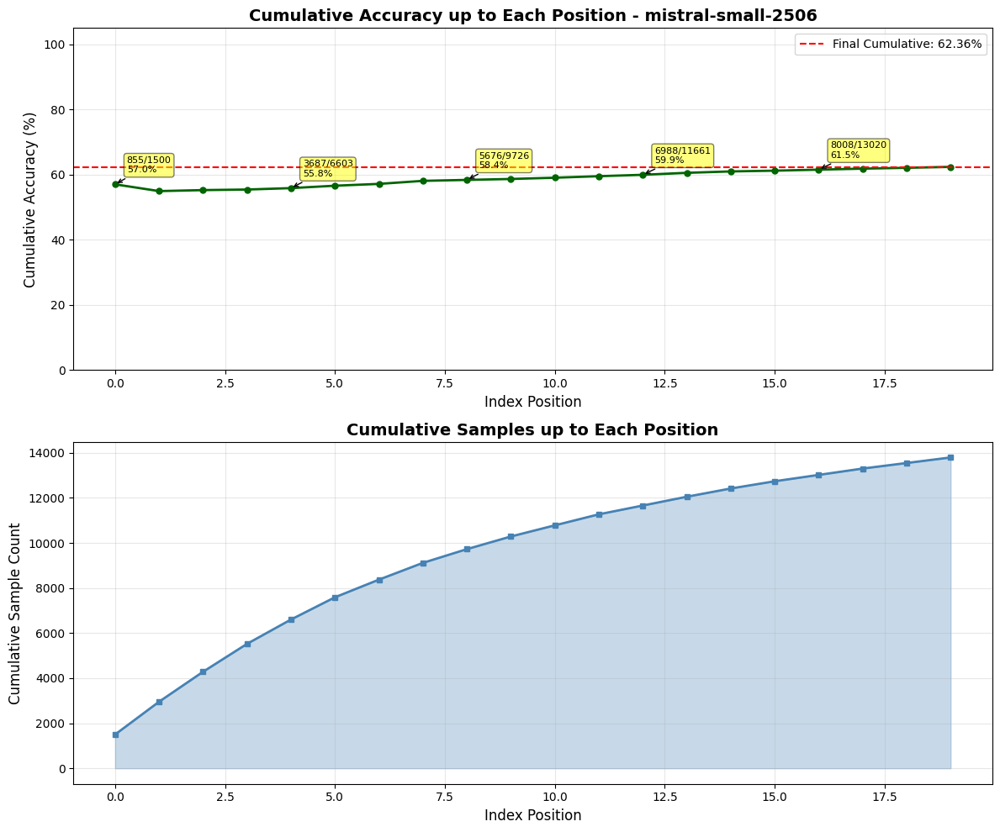


<mui:table-metadata title="Cumulative Accuracy by Position (Min Count: 200)" />
| Position | Cumulative Correct | Cumulative Total | Cumulative Accuracy |
|----------|-------------------|------------------|---------------------|
|        0 |               855 |             1500 |              57.00% |
|        1 |              1623 |             2955 |              54.92% |
|        2 |              2366 |             4284 |              55.23% |
|        3 |              3060 |             5523 |              55.40% |
|        4 |              3687 |             6603 |              55.84% |
|        5 |              4294 |             7590 |              56.57% |
|        6 |              4784 |             8373 |              57.14% |
|        7 |              5294 |             9117 |              58.07% |
|        8 |              5676 |             9726 |              58.36% |
|        9 |              6033 |            10287 |              58.65% |
|       10 |              6365

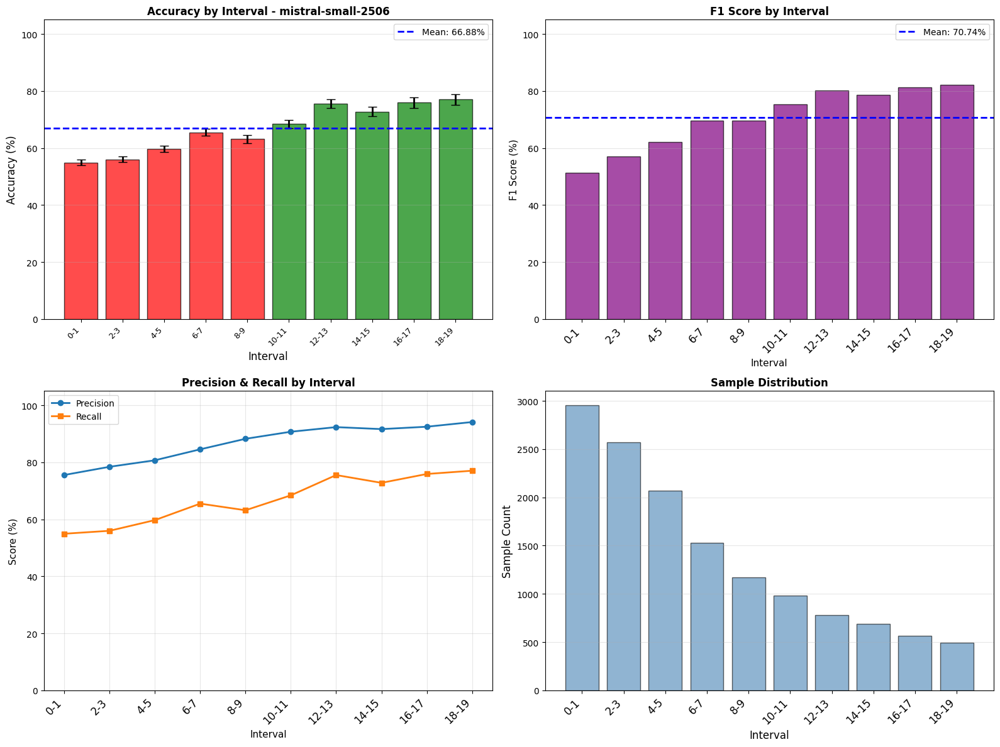

/tmp/ipykernel_87590/1396084640.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved: ./Full/plots2/mistral-small-2506_class_distribution_comparison.png


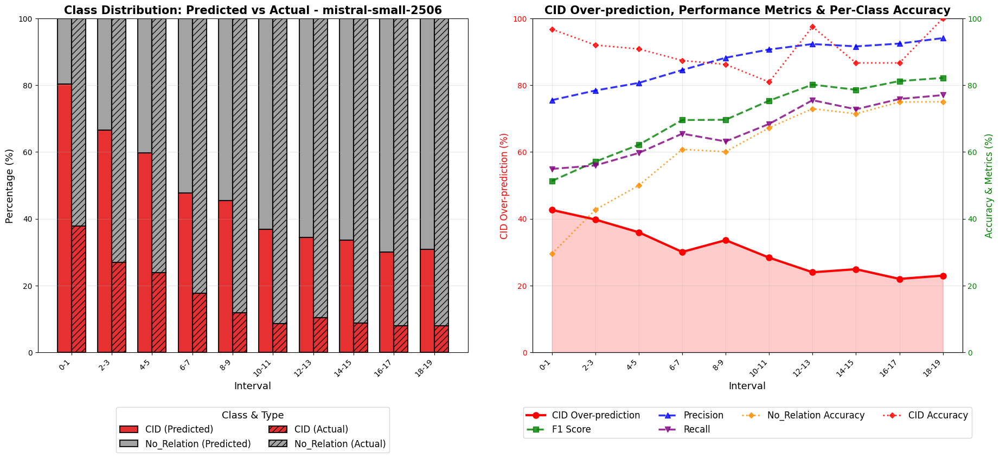


<mui:table-metadata title="Interval Analysis (size=2, min_count=200)" />
| Interval | Total | Accuracy | Precision | Recall | F1 Score | Std Error |
|----------|-------|----------|-----------|--------|----------|-----------|
| 0-1      |  2955 |   54.92% |    75.53% | 54.92% |   51.31% | ±    0.92% |
| 2-3      |  2568 |   55.96% |    78.41% | 55.96% |   57.10% | ±    0.98% |
| 4-5      |  2067 |   59.70% |    80.69% | 59.70% |   62.15% | ±    1.08% |
| 6-7      |  1527 |   65.49% |    84.54% | 65.49% |   69.56% | ±    1.22% |
| 8-9      |  1170 |   63.16% |    88.23% | 63.16% |   69.65% | ±    1.41% |
| 10-11    |   984 |   68.39% |    90.71% | 68.39% |   75.36% | ±    1.48% |
| 12-13    |   780 |   75.51% |    92.33% | 75.51% |   80.18% | ±    1.54% |
| 14-15    |   687 |   72.78% |    91.63% | 72.78% |   78.63% | ±    1.70% |
| 16-17    |   564 |   75.89% |    92.46% | 75.89% |   81.24% | ±    1.80% |
| 18-19    |   492 |   77.03% |    94.11% | 77.03% |   82.19% | ±    1.90% |

Bes

(['0-1',
  '2-3',
  '4-5',
  '6-7',
  '8-9',
  '10-11',
  '12-13',
  '14-15',
  '16-17',
  '18-19'],
 {'accuracy': [54.923857868020306,
   55.95794392523364,
   59.700048379293655,
   65.48788474132286,
   63.16239316239316,
   68.39430894308943,
   75.51282051282051,
   72.7802037845706,
   75.88652482269504,
   77.03252032520325],
  'precision': [75.530651721178,
   78.40939366274262,
   80.69133116997585,
   84.53510258218492,
   88.22573569768603,
   90.70600928790459,
   92.32646114380023,
   91.63122176222612,
   92.46472891503863,
   94.10702824133504],
  'recall': [54.923857868020306,
   55.95794392523364,
   59.700048379293655,
   65.48788474132286,
   63.16239316239316,
   68.39430894308943,
   75.51282051282051,
   72.7802037845706,
   75.88652482269504,
   77.03252032520325],
  'f1': [51.31174727406195,
   57.10150748538037,
   62.14913320653414,
   69.56207092613099,
   69.65051679706582,
   75.35908316471671,
   80.18251073338276,
   78.62884149553643,
   81.2369656430340

In [21]:
def plot_class_distributions_comparison(intervals, pred_distributions, true_distributions, interval_totals, model_name, save_dir=None, f1_scores=None, precision=None, recall=None, per_class_accuracy=None):
    """Plot stacked bar comparison of predicted vs actual class distributions with CID metrics and per-class accuracy."""
    import matplotlib.pyplot as plt
    import os
    
    # Get all unique classes
    all_classes = set()
    for dist in pred_distributions + true_distributions:
        all_classes.update(dist.keys())
    all_classes = sorted(all_classes)
    
    if not all_classes:
        print("No class distribution data available")
        return
    
    # Prepare data for stacked bars
    pred_percentages = {cls: [] for cls in all_classes}
    true_percentages = {cls: [] for cls in all_classes}
    
    for pred_dist, true_dist, total in zip(pred_distributions, true_distributions, interval_totals):
        for cls in all_classes:
            pred_count = pred_dist.get(cls, 0)
            true_count = true_dist.get(cls, 0)
            pred_percentages[cls].append((pred_count / total * 100) if total > 0 else 0)
            true_percentages[cls].append((true_count / total * 100) if total > 0 else 0)
    
    # Calculate CID over-prediction (only positive: predicted > actual)
    cid_over_pred = []
    if 'CID' in pred_percentages and 'CID' in true_percentages:
        for pred_pct, true_pct in zip(pred_percentages['CID'], true_percentages['CID']):
            over_pred = max(0, pred_pct - true_pct)  # Only positive values
            cid_over_pred.append(over_pred)
    
    # Create figure with 2 subplots side by side
    fig = plt.figure(figsize=(22, 8))
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 1], wspace=0.15)
    ax1 = fig.add_subplot(gs[0])
    ax2 = fig.add_subplot(gs[1])
    
    # ========== SUBPLOT 1: Stacked Bar Chart ==========
    x = np.arange(len(intervals))
    width = 0.35  # Width of each bar
    
    # Use complementary colors for classes
    n_classes = len(all_classes)
    base_colors = plt.cm.Set1(np.linspace(0, 1, n_classes))
    
    # Plot predicted (left bar, solid)
    bottom_pred = np.zeros(len(intervals))
    for i, cls in enumerate(all_classes):
        ax1.bar(x - width/2, pred_percentages[cls], width, bottom=bottom_pred,
               label=f'{cls} (Predicted)', alpha=0.9, edgecolor='black', 
               color=base_colors[i], linewidth=1.5)
        bottom_pred += pred_percentages[cls]
    
    # Plot actual (right bar, striped)
    bottom_true = np.zeros(len(intervals))
    for i, cls in enumerate(all_classes):
        ax1.bar(x + width/2, true_percentages[cls], width, bottom=bottom_true,
               label=f'{cls} (Actual)', alpha=0.9, edgecolor='black',
               color=base_colors[i], hatch='///', linewidth=1.5)
        bottom_true += true_percentages[cls]
    
    ax1.set_xlabel('Interval', fontsize=13)
    ax1.set_ylabel('Percentage (%)', fontsize=13)
    ax1.set_title(f'Class Distribution: Predicted vs Actual - {model_name}', fontsize=15, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(intervals, rotation=45, ha='right')
    ax1.legend(title='Class & Type', loc='upper center', bbox_to_anchor=(0.5, -0.15), fontsize=12, title_fontsize=13, ncol=2)
    ax1.grid(True, alpha=0.3, axis='y')
    ax1.set_ylim(0, 100)
    
    # ========== SUBPLOT 2: CID Over-Prediction with Performance Metrics & Per-Class Accuracy ==========
    if cid_over_pred:
        # Plot CID over-prediction on primary y-axis (0-100 range)
        ax2.plot(x, cid_over_pred, color='red', linewidth=3, marker='o',
                markersize=8, label='CID Over-prediction', zorder=3)
        ax2.fill_between(x, cid_over_pred, 0, alpha=0.2, color='red', zorder=1)
        
        # Set labels for primary axis
        ax2.set_xlabel('Interval', fontsize=13)
        ax2.set_ylabel('CID Over-prediction (%)', fontsize=12, color='red')
        ax2.tick_params(axis='y', labelcolor='red')
        ax2.set_ylim(0, 100)
        
        # Create twin axis for performance metrics and per-class accuracy
        ax2_metrics = ax2.twinx()
        
        # Plot overall performance metrics
        if f1_scores is not None and len(f1_scores) == len(intervals):
            f1_array = np.array(f1_scores)
            ax2_metrics.plot(x, f1_array, color='green', linewidth=2.5, marker='s',
                       markersize=7, label='F1 Score', alpha=0.8, zorder=4, linestyle='--')
            
        if precision is not None and len(precision) == len(intervals):
            prec_array = np.array(precision)
            ax2_metrics.plot(x, prec_array, color='blue', linewidth=2.5, marker='^',
                       markersize=7, label='Precision', alpha=0.8, zorder=4, linestyle='--')
            
        if recall is not None and len(recall) == len(intervals):
            rec_array = np.array(recall)
            ax2_metrics.plot(x, rec_array, color='purple', linewidth=2.5, marker='v',
                       markersize=7, label='Recall', alpha=0.8, zorder=4, linestyle='--')
        
        # Plot per-class accuracy curves
        if per_class_accuracy is not None:
            class_colors = {'CID': 'red', 'No_Relation': 'darkorange', 'DID': 'darkgreen', 
                           'CIBD': 'darkorange', 'Other': 'gray'}
            
            for cls, accuracies in per_class_accuracy.items():
                if len(accuracies) == len(intervals):
                    color = class_colors.get(cls, 'black')
                    ax2_metrics.plot(x, accuracies, color=color, linewidth=2, marker='D',
                               markersize=5, label=f'{cls} Accuracy', alpha=0.8, zorder=4, linestyle=':')
        
        ax2_metrics.set_ylabel('Accuracy & Metrics (%)', fontsize=12, color='green')
        ax2_metrics.tick_params(axis='y', labelcolor='green')
        ax2_metrics.set_ylim(0, 100)
        
        ax2.set_title('CID Over-prediction, Performance Metrics & Per-Class Accuracy', fontsize=15, fontweight='bold')
        ax2.set_xticks(x)
        ax2.set_xticklabels(intervals, rotation=45, ha='right')
        
        # Combine legends
        lines1, labels1 = ax2.get_legend_handles_labels()
        lines2, labels2 = ax2_metrics.get_legend_handles_labels()
        ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper center', 
                  bbox_to_anchor=(0.5, -0.15), fontsize=12, ncol=4)
        
        ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        filename = f"{model_name}_class_distribution_comparison.png"
        filepath = os.path.join(save_dir, filename)
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
        print(f"Saved: {filepath}")
    
    plt.show()


def analyze_intervals(position_counts, correct_counts, position_predictions, position_ground_truth, 
                     min_count=3, interval_size=10, model_name="unknown_model", save_dir=None):
    """
    Analyze all metrics across intervals to find well-performing ranges.
    
    Args:
        position_counts: Dict of position -> count
        correct_counts: Dict of position -> correct count
        position_predictions: Dict of position -> list of predictions
        position_ground_truth: Dict of position -> list of true labels
        min_count: Minimum samples for a position
        interval_size: Size of each interval to analyze
        model_name: Name of the model being analyzed
        save_dir: Directory to save plots (if None, plots are only displayed)
    """
    import matplotlib.pyplot as plt
    import os
    
    model_name = model_name.replace('mistral/', '', 1)
    sorted_positions = sorted([pos for pos, count in position_counts.items() if count >= min_count])
    
    if not sorted_positions:
        print("No positions meet minimum count requirement")
        return
    
    # Create intervals
    min_pos = sorted_positions[0]
    max_pos = sorted_positions[-1]
    
    intervals = []
    interval_metrics = {
        'accuracy': [], 'precision': [], 'recall': [], 'f1': [],
        'totals': [], 'corrects': [], 'errors': []
    }
    interval_pred_distributions = []  # Predicted label distributions
    interval_true_distributions = []  # Actual label distributions
    interval_predictions_raw = []  # Store raw predictions per interval
    interval_ground_truth_raw = []  # Store raw ground truth per interval
    interval_per_class_accuracy = {}  # Store per-class accuracy per interval
    
    current_start = min_pos
    while current_start <= max_pos:
        current_end = current_start + interval_size - 1
        
        # Get positions in this interval
        positions_in_interval = [p for p in sorted_positions if current_start <= p <= current_end]
        
        if positions_in_interval:
            # Aggregate predictions and ground truth
            interval_pred = []
            interval_true = []
            for pos in positions_in_interval:
                if pos in position_predictions and pos in position_ground_truth:
                    interval_pred.extend(position_predictions[pos])
                    interval_true.extend(position_ground_truth[pos])
            
            total = len(interval_true)
            correct = sum(1 for p, t in zip(interval_pred, interval_true) if p == t)
            
            if total > 0:
                # Calculate metrics
                accuracy = (correct / total) * 100
                precision = precision_score(interval_true, interval_pred, average='weighted', zero_division=0) * 100
                recall = recall_score(interval_true, interval_pred, average='weighted', zero_division=0) * 100
                f1 = f1_score(interval_true, interval_pred, average='weighted', zero_division=0) * 100
                
                # Standard error
                p = correct / total
                std_error = np.sqrt(p * (1 - p) / total) * 100
                
                # Predicted class distribution
                pred_dist = {}
                for label in interval_pred:
                    pred_dist[label] = pred_dist.get(label, 0) + 1
                
                # Actual class distribution
                true_dist = {}
                for label in interval_true:
                    true_dist[label] = true_dist.get(label, 0) + 1
                
                interval_label = f"{current_start}-{current_end}"
                intervals.append(interval_label)
                interval_metrics['accuracy'].append(accuracy)
                interval_metrics['precision'].append(precision)
                interval_metrics['recall'].append(recall)
                interval_metrics['f1'].append(f1)
                interval_metrics['totals'].append(total)
                interval_metrics['corrects'].append(correct)
                interval_metrics['errors'].append(std_error)
                interval_pred_distributions.append(pred_dist)
                interval_true_distributions.append(true_dist)
                interval_predictions_raw.append(interval_pred)
                interval_ground_truth_raw.append(interval_true)
                
                # Calculate per-class accuracy for this interval
                for cls in set(interval_true):
                    if cls not in interval_per_class_accuracy:
                        interval_per_class_accuracy[cls] = []
                    
                    true_count = sum(1 for t in interval_true if t == cls)
                    if true_count > 0:
                        correct_count = sum(1 for p, t in zip(interval_pred, interval_true) if p == cls and t == cls)
                        cls_accuracy = (correct_count / true_count) * 100
                        interval_per_class_accuracy[cls].append(cls_accuracy)
                    else:
                        interval_per_class_accuracy[cls].append(np.nan)
        
        current_start += interval_size
    
    # Ensure all classes have same length (fill with NaN if class not present in some intervals)
    for cls in interval_per_class_accuracy:
        while len(interval_per_class_accuracy[cls]) < len(intervals):
            interval_per_class_accuracy[cls].append(np.nan)
    
    # Create visualization
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
    
    x_pos = range(len(intervals))
    
    # Plot 1: Accuracy with error bars
    colors = ['green' if acc >= np.mean(interval_metrics['accuracy']) else 'red' 
              for acc in interval_metrics['accuracy']]
    ax1.bar(x_pos, interval_metrics['accuracy'], color=colors, alpha=0.7, edgecolor='black',
            yerr=interval_metrics['errors'], capsize=5, error_kw={'linewidth': 2, 'ecolor': 'black'})
    ax1.axhline(y=np.mean(interval_metrics['accuracy']), color='blue', linestyle='--', 
                linewidth=2, label=f'Mean: {np.mean(interval_metrics["accuracy"]):.2f}%')
    ax1.set_xlabel('Interval', fontsize=12)
    ax1.set_ylabel('Accuracy (%)', fontsize=12)
    ax1.set_title(f'Accuracy by Interval - {model_name}', fontsize=12, fontweight='bold')
    ax1.set_xticks(x_pos)
    ax1.set_xticklabels(intervals, rotation=45, ha='right', fontsize=9)
    ax1.grid(True, alpha=0.3, axis='y')
    ax1.legend()
    ax1.set_ylim(0, 105)
    
    # Plot 2: F1 Score
    ax2.bar(x_pos, interval_metrics['f1'], alpha=0.7, color='purple', edgecolor='black')
    ax2.axhline(y=np.mean(interval_metrics['f1']), color='blue', linestyle='--', 
                linewidth=2, label=f'Mean: {np.mean(interval_metrics["f1"]):.2f}%')
    ax2.set_xlabel('Interval', fontsize=11)
    ax2.set_ylabel('F1 Score (%)', fontsize=11)
    ax2.set_title('F1 Score by Interval', fontsize=12, fontweight='bold')
    ax2.set_xticks(x_pos)
    ax2.set_xticklabels(intervals, rotation=45, ha='right', fontsize=12)
    ax2.grid(True, alpha=0.3, axis='y')
    ax2.legend()
    ax2.set_ylim(0, 105)
    
    # Plot 3: Precision and Recall
    ax3.plot(x_pos, interval_metrics['precision'], marker='o', label='Precision', linewidth=2)
    ax3.plot(x_pos, interval_metrics['recall'], marker='s', label='Recall', linewidth=2)
    ax3.set_xlabel('Interval', fontsize=11)
    ax3.set_ylabel('Score (%)', fontsize=11)
    ax3.set_title('Precision & Recall by Interval', fontsize=12, fontweight='bold')
    ax3.set_xticks(x_pos)
    ax3.set_xticklabels(intervals, rotation=45, ha='right', fontsize=12)
    ax3.grid(True, alpha=0.3)
    ax3.legend()
    ax3.set_ylim(0, 105)
    
    # Plot 4: Sample counts
    ax4.bar(x_pos, interval_metrics['totals'], alpha=0.6, color='steelblue', edgecolor='black')
    ax4.set_xlabel('Interval', fontsize=12)
    ax4.set_ylabel('Sample Count', fontsize=12)
    ax4.set_title('Sample Distribution', fontsize=12, fontweight='bold')
    ax4.set_xticks(x_pos)
    ax4.set_xticklabels(intervals, rotation=45, ha='right', fontsize=12)
    ax4.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        filename = f"{model_name}_interval_metrics.png"
        filepath = os.path.join(save_dir, filename)
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
        print(f"Saved: {filepath}")
    
    plt.show()
    
    # Plot class distributions (both predicted and actual) with per-class accuracy
    plot_class_distributions_comparison(intervals, interval_pred_distributions, 
                                       interval_true_distributions, interval_metrics['totals'],
                                       model_name, save_dir, 
                                       f1_scores=interval_metrics['f1'],
                                       precision=interval_metrics['precision'],
                                       recall=interval_metrics['recall'],
                                       per_class_accuracy=interval_per_class_accuracy)
    
    # Print interval analysis table
    print(f"\n<mui:table-metadata title=\"Interval Analysis (size={interval_size}, min_count={min_count})\" />")
    print("| Interval | Total | Accuracy | Precision | Recall | F1 Score | Std Error |")
    print("|----------|-------|----------|-----------|--------|----------|-----------|")
    
    for i, interval in enumerate(intervals):
        print(f"| {interval:8s} | {interval_metrics['totals'][i]:5d} | "
              f"{interval_metrics['accuracy'][i]:7.2f}% | {interval_metrics['precision'][i]:8.2f}% | "
              f"{interval_metrics['recall'][i]:5.2f}% | {interval_metrics['f1'][i]:7.2f}% | "
              f"±{interval_metrics['errors'][i]:8.2f}% |")
    
    print(f"\nBest F1 interval: {intervals[np.argmax(interval_metrics['f1'])]} "
          f"({max(interval_metrics['f1']):.2f}%)")
    print(f"Worst F1 interval: {intervals[np.argmin(interval_metrics['f1'])]} "
          f"({min(interval_metrics['f1']):.2f}%)")
    
    # Print class distributions comparison
    print(f"\n<mui:table-metadata title=\"Class Distribution Comparison by Interval\" />")
    print_class_distribution_comparison_table(intervals, interval_pred_distributions, 
                                             interval_true_distributions, interval_metrics['totals'])
    
    # ========== NEW: Print per-class accuracy table ==========
    print(f"\n<mui:table-metadata title=\"Per-Class Accuracy by Interval\" />")
    print_per_class_accuracy_by_interval(intervals, interval_predictions_raw, interval_ground_truth_raw)
    
    return intervals, interval_metrics, interval_pred_distributions, interval_true_distributions


def print_per_class_accuracy_by_interval(intervals, interval_predictions, interval_ground_truth):
    """
    Calculate and print per-class accuracy for each interval.
    Accuracy for class X = (correctly predicted as X) / (actual instances of X)
    """
    # Get all unique classes
    all_classes = set()
    for preds, truths in zip(interval_predictions, interval_ground_truth):
        all_classes.update(preds)
        all_classes.update(truths)
    all_classes = sorted(all_classes)
    
    # Build header
    header = "| Interval |"
    separator = "|----------|"
    for cls in all_classes:
        header += f" {cls[:10]:>10s} |"
        separator += "------------|"
    print(header)
    print(separator)
    
    # Calculate and print per-class accuracy for each interval
    for interval, preds, truths in zip(intervals, interval_predictions, interval_ground_truth):
        row = f"| {interval:8s} |"
        
        for cls in all_classes:
            # Count actual instances of this class
            true_count = sum(1 for t in truths if t == cls)
            
            if true_count > 0:
                # Count correct predictions: where prediction == truth == cls
                correct_count = sum(1 for p, t in zip(preds, truths) if p == cls and t == cls)
                accuracy = (correct_count / true_count) * 100
                row += f" {accuracy:5.1f}%({true_count:2d}) |"
            else:
                row += f"      -      |"
        
        print(row)
    
    print("\nNote: Format is Accuracy%(Total Actual Instances)")
    print("Accuracy = (Correctly Predicted as X) / (Total Actual X)")

    # Example usage:
position_metrics, counts, correct, predictions, ground_truth, model_name = calculate_and_plot_index_effect(
    #  processed_results, Answers, min_count=20, prompt_type="multi_examples", save_dir="LLM_benchmarks/Results/CID/Full/plots"
     processed_results, Answers, min_count=200, prompt_type="multi_zero", save_dir="./Full/plots2"
 )
#
# Analyze intervals with all metrics, error bars, and class distributions:
analyze_intervals(counts, correct, predictions, ground_truth, 
                #   min_count=20, interval_size=5, model_name=model_name, save_dir="LLM_benchmarks/Results/CID/Full/plots")
                  min_count=200, interval_size=2, model_name=model_name, save_dir="./Full/plots2")


=== Overall Performance ===
Accuracy:  62.64% (10495/16755)
Precision: 84.75%
Recall:    61.73%
F1 Score:  65.47%
Positions analyzed (min_count=100): 30

=== Classification Report (Overall) ===
              precision    recall  f1-score   support

         CID       0.33      0.94      0.49      2946
 No_Relation       0.97      0.54      0.70     12276

    accuracy                           0.62     15222
   macro avg       0.65      0.74      0.59     15222
weighted avg       0.85      0.62      0.65     15222


<mui:table-metadata title="Metrics by Index Position (Min Count: 100)" />
| Position | Count | Accuracy | Precision | Recall | F1 Score |
|----------|-------|----------|-----------|--------|----------|
|        0 |  1500 |   52.00% |    81.08% | 52.00% |   51.91% |
|        1 |  1455 |   57.18% |    79.33% | 57.18% |   57.42% |
|        2 |  1329 |   58.09% |    82.23% | 58.09% |   60.57% |
|        3 |  1239 |   64.41% |    83.36% | 64.41% |   66.45% |
|        4 |  1080 

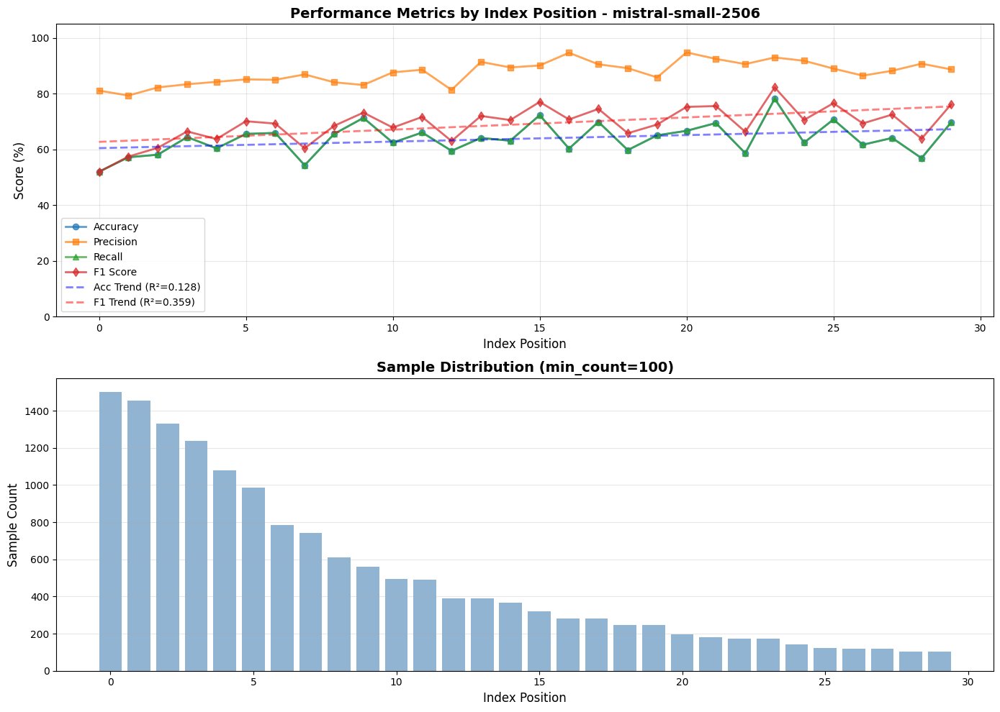

Saved: ./Full/plots/mistral-small-2506_per_class_performance.png


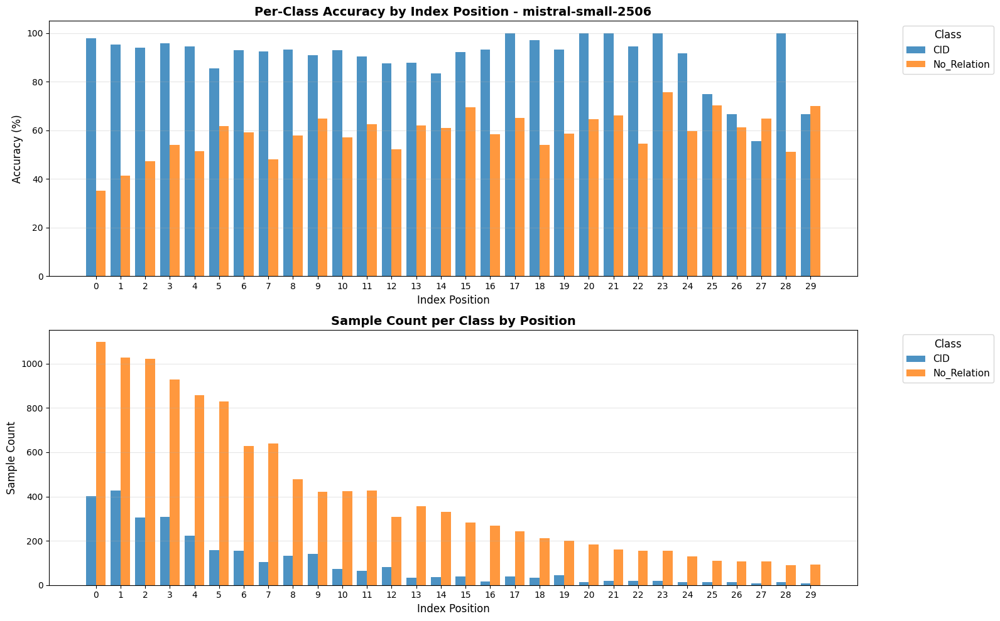


<mui:table-metadata title="Per-Class Accuracy by Position" />
| Position |        CID | No_Relatio |
|----------|------------|------------|
|        0 |  97.8%(402) |  35.2%(1098) |
|        1 |  95.3%(426) |  41.4%(1029) |
|        2 |  94.1%(306) |  47.3%(1023) |
|        3 |  95.8%(309) |  54.0%(930) |
|        4 |  94.6%(222) |  51.5%(858) |
|        5 |  85.5%(159) |  61.7%(828) |
|        6 |  92.9%(156) |  59.2%(627) |
|        7 |  92.4%(105) |  48.0%(639) |
|        8 |  93.2%(132) |  57.9%(477) |
|        9 |  90.8%(141) |  64.8%(420) |
|       10 |  93.1%(72) |  57.2%(423) |
|       11 |  90.5%(63) |  62.4%(426) |
|       12 |  87.7%(81) |  52.1%(309) |
|       13 |  87.9%(33) |  61.9%(357) |
|       14 |  83.3%(36) |  60.9%(330) |
|       15 |  92.3%(39) |  69.5%(282) |
|       16 |  93.3%(15) |  58.4%(267) |
|       17 | 100.0%(39) |  65.0%(243) |
|       18 |  97.0%(33) |  54.0%(213) |
|       19 |  93.3%(45) |  58.7%(201) |
|       20 | 100.0%(12) |  64.5%(183) |
|     

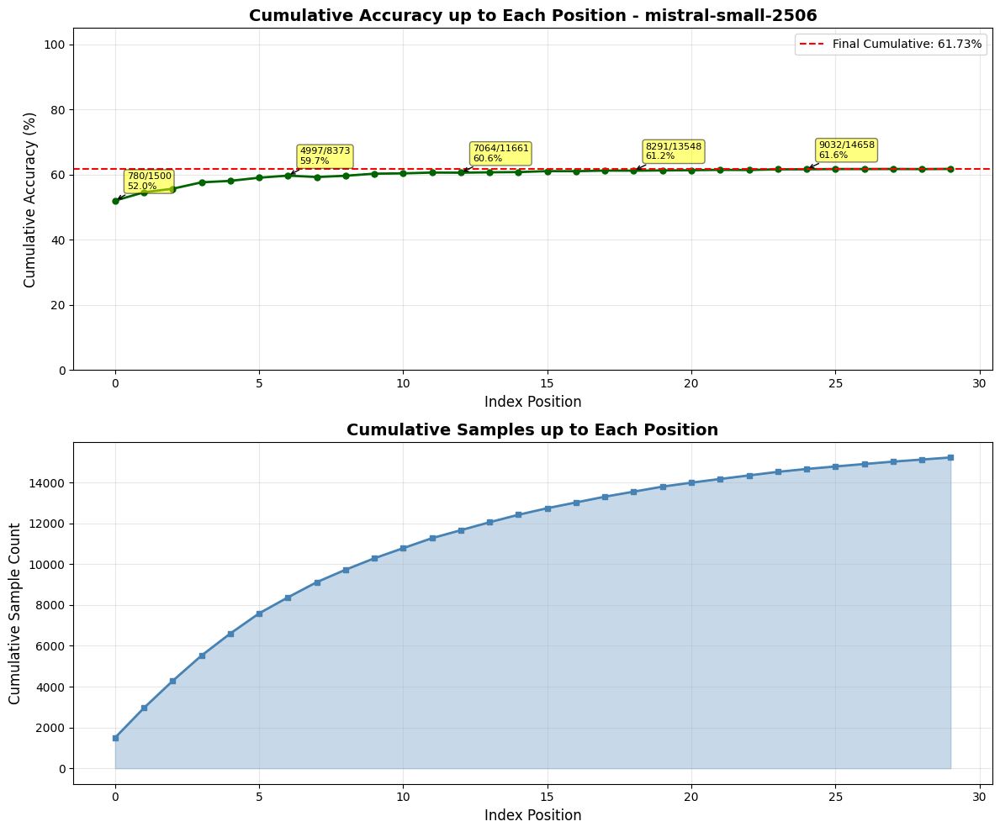


<mui:table-metadata title="Cumulative Accuracy by Position (Min Count: 100)" />
| Position | Cumulative Correct | Cumulative Total | Cumulative Accuracy |
|----------|-------------------|------------------|---------------------|
|        0 |               780 |             1500 |              52.00% |
|        1 |              1612 |             2955 |              54.55% |
|        2 |              2384 |             4284 |              55.65% |
|        3 |              3182 |             5523 |              57.61% |
|        4 |              3834 |             6603 |              58.06% |
|        5 |              4481 |             7590 |              59.04% |
|        6 |              4997 |             8373 |              59.68% |
|        7 |              5401 |             9117 |              59.24% |
|        8 |              5800 |             9726 |              59.63% |
|        9 |              6200 |            10287 |              60.27% |
|       10 |              6509

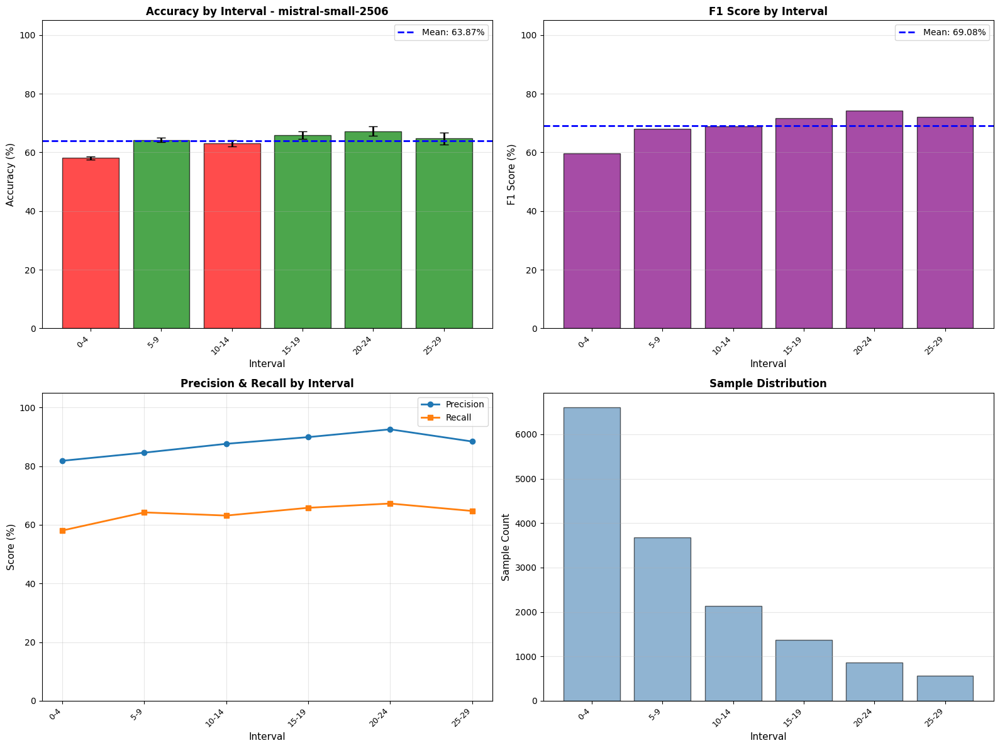

/tmp/ipykernel_13287/1830180254.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved: ./Full/plots/mistral-small-2506_class_distribution_comparison.png


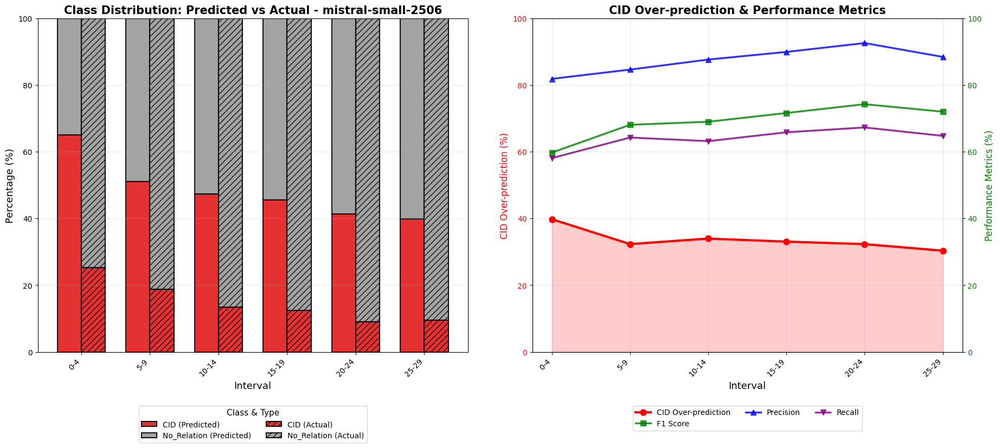


<mui:table-metadata title="Interval Analysis (size=5, min_count=100)" />
| Interval | Total | Accuracy | Precision | Recall | F1 Score | Std Error |
|----------|-------|----------|-----------|--------|----------|-----------|
| 0-4      |  6603 |   58.06% |    81.82% | 58.06% |   59.72% | ±    0.61% |
| 5-9      |  3684 |   64.22% |    84.59% | 64.22% |   68.05% | ±    0.79% |
| 10-14    |  2130 |   63.15% |    87.60% | 63.15% |   68.96% | ±    1.05% |
| 15-19    |  1377 |   65.80% |    89.88% | 65.80% |   71.58% | ±    1.28% |
| 20-24    |   864 |   67.25% |    92.54% | 67.25% |   74.22% | ±    1.60% |
| 25-29    |   564 |   64.72% |    88.39% | 64.72% |   71.98% | ±    2.01% |

Best F1 interval: 20-24 (74.22%)
Worst F1 interval: 0-4 (59.72%)

<mui:table-metadata title="Class Distribution Comparison by Interval" />
| Interval | Total |    CID_Pred |    CID_True | No_Rel_Pred | No_Rel_True |
|----------|-------|-----------|-----------|-----------|-----------|
| 0-4      |  6603 | 4290(

(['0-4', '5-9', '10-14', '15-19', '20-24', '25-29'],
 {'accuracy': [58.06451612903226,
   64.22366992399566,
   63.14553990610329,
   65.79520697167756,
   67.24537037037037,
   64.71631205673759],
  'precision': [81.81963010003678,
   84.58748882545322,
   87.59810048646005,
   89.88225768094044,
   92.53523730333684,
   88.39327182577041],
  'recall': [58.06451612903226,
   64.22366992399566,
   63.14553990610329,
   65.79520697167756,
   67.24537037037037,
   64.71631205673759],
  'f1': [59.71650189559819,
   68.04504654644396,
   68.95904071723812,
   71.5825231529977,
   74.21558909897978,
   71.97575087328708],
  'totals': [6603, 3684, 2130, 1377, 864, 564],
  'corrects': [3834, 2366, 1345, 906, 581, 365],
  'errors': [np.float64(0.6072612738128558),
   np.float64(0.7897427414613477),
   np.float64(1.0452653773999698),
   np.float64(1.2784202524389023),
   np.float64(1.5966534739033769),
   np.float64(2.0121220227619263)]},
 [{'CID': 4290, 'No_Relation': 2313},
  {'No_Relation': 